# Result Analysis - FedConvergence x Fed Divergence on Non IID settings

### Preliminary Setup

In [1]:
from experiment_result import ExperimentResult, load_experiments_from_csv
import matplotlib.pyplot as plt
import numpy as np


In [2]:
csv_file_path = "experiments_fl.csv"
experiments = load_experiments_from_csv(csv_file_path)

print(len(experiments))

[Errno 2] No such file or directory: 'nan/centralized_metrics.csv'
[Errno 2] No such file or directory: 'nan/centralized_metrics.csv'
163


In [3]:
def filter_experiment(exp, criteria):
    for key, value in criteria.items():
        # Check if the value is a list, meaning we want to match any of the values in the list
        attr_value = getattr(exp, key)
        if isinstance(value, list):
            if attr_value not in value:
                return False
        else:
            if attr_value != value:
                return False
    return True

def filter_experiments(experiments, criteria):
    return [exp for exp in experiments if filter_experiment(exp, criteria)]

def plot_centralized_metrics(experiments, title="Experiment Results", metric = 'centralized_accuracy', label_attr = 'strategy'):
    exp_strategy_cnt = {}
    
    # Create a new figure with the specified size and DPI
    figsize=(12, 8)
    plt.figure(figsize=figsize, dpi=100)
    for exp in experiments:
        if exp.centralized_metrics is not None:
             # Generate a sequence of increasing values starting from 1
            rounds = range(1, len(exp.centralized_metrics) + 1)
            label = getattr(exp, label_attr, 'Unknown')
            plt.plot(rounds, exp.centralized_metrics[metric], label=f"{label}")
            #exp_strategy_cnt[exp.strategy] = exp_strategy_cnt.get(exp.strategy, 0) + 1

    plt.title(title)
    plt.xlabel("Round")
    plt.ylabel(metric)
    plt.legend()
    plt.show()
    
    
    
def plot_distributed_metrics(experiments, title="Experiment Results", metric = 'aggregated_test_accuracy', label_attr = 'strategy'):
    for exp in experiments:
        if exp.centralized_metrics is not None:
             # Generate a sequence of increasing values starting from 1
            rounds = range(1, len(exp.centralized_metrics) )
            label = getattr(exp, label_attr, 'Unknown')
            plt.plot(rounds, exp.distributed_metrics[metric], label=f"{label_attr} = {label}")

    plt.title(title)
    plt.xlabel("Round")
    plt.ylabel(metric)
    plt.legend()
    plt.show()
    
def plot_fourier_metric(experiments, metric='centralized_accuracy', title="Fourier Transform of Metric", label_attr='strategy'):
    """Plots the Fourier Transform of a selected metric from the experiment results.

    Parameters
    ----------
    experiments : list
        List of experiment objects containing metrics.
    metric : str
        The metric to be analyzed (default is 'centralized_accuracy').
    title : str
        The title of the plot.
    label_attr : str
        The attribute used for labeling different experiments.
    """
    plt.figure(figsize=(12, 8), dpi=100)

    for exp in experiments:
        if exp.centralized_metrics is not None:
            # Extract the metric values and compute the Fourier Transform
            data = np.array(exp.centralized_metrics[metric])
            fourier_transform = np.fft.fft(data)
            freqs = np.fft.fftfreq(len(data))

            # Only use positive frequencies and their magnitudes
            positive_freqs = freqs[:len(freqs) // 2]
            positive_magnitudes = np.abs(fourier_transform)[:len(freqs) // 2]

            # Get the label for the plot
            label = getattr(exp, label_attr, 'Unknown')

            # Plot the magnitude spectrum of the positive frequencies
            plt.plot(positive_freqs, positive_magnitudes, label=f"{label_attr} = {label}")

    plt.title(title)
    plt.xlabel("Frequency")
    plt.ylabel("Amplitude")
    plt.legend()
    plt.grid(True)
    plt.show()

## NON IID - partitioning: label_quantity

0


/var/folders/td/rb51glxn0szd7vlny3hlk5xh0000gn/T/ipykernel_58417/1097898871.py:49: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


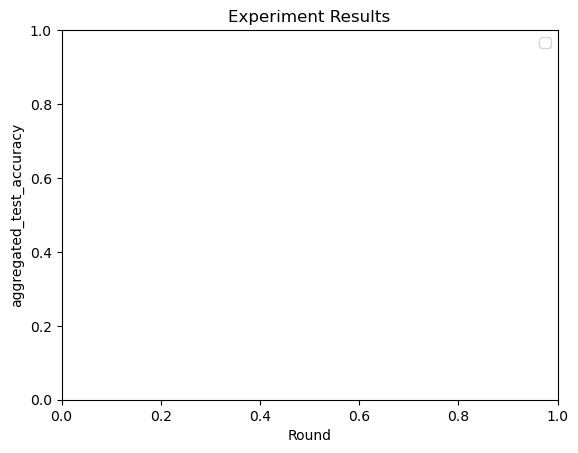

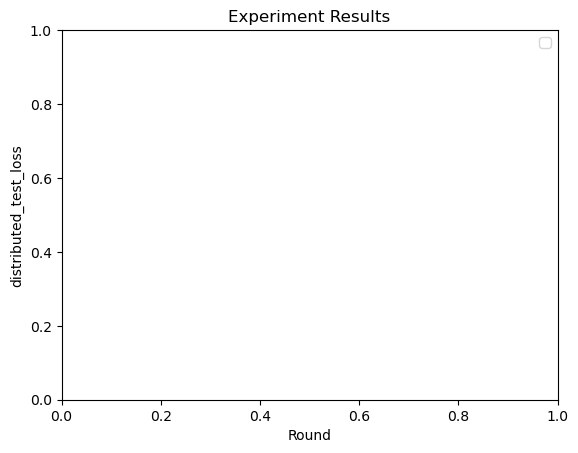

In [19]:

# Define filter criteria
filter_criteria = {
    'dataset': 'mnist',
    'fraction_fit': 0.7,
    'partitioning_type': 'label_quantity',
    'total_clients': 20,
    'local_epochs': 1,
    'num_rounds': 50,
    'labels_per_client': 3, 
}

# Apply the single filter and plot the results

filtered_experiments = filter_experiments(experiments, filter_criteria)

print(len(filtered_experiments))
#plot_centralized_metrics(filtered_experiments, title="Accuracy Over Rounds - MNIST FedAvg Label Quantity")
plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'aggregated_test_accuracy')
plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'distributed_test_loss')

0


C:\Users\AFreitas\AppData\Local\Temp\ipykernel_28908\1097898871.py:33: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


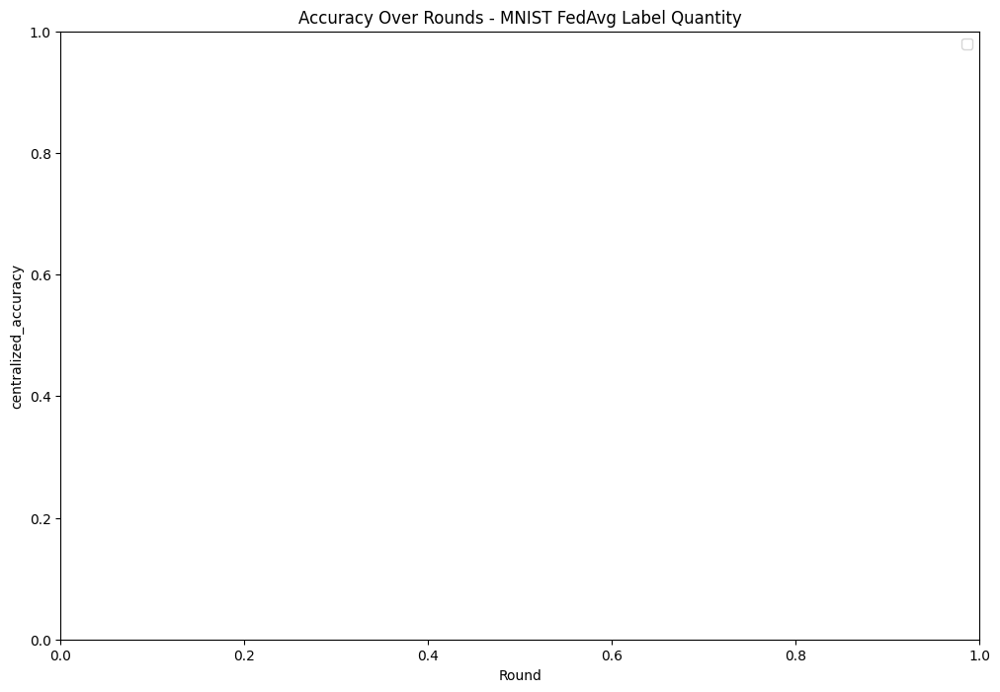

C:\Users\AFreitas\AppData\Local\Temp\ipykernel_28908\1097898871.py:49: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


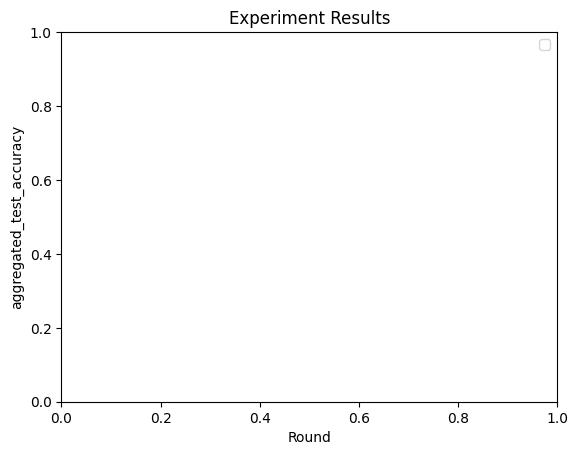

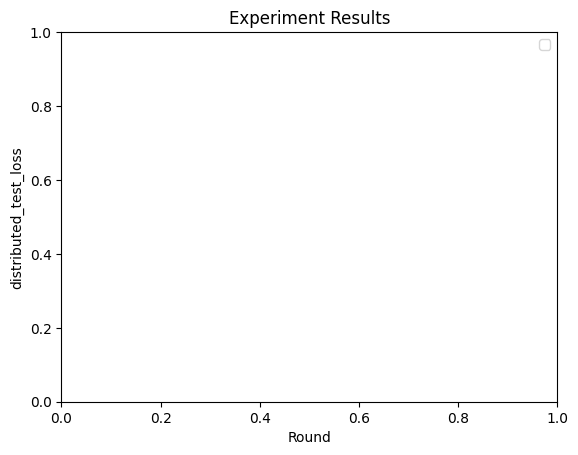

In [6]:
# Define filter criteria
filter_criteria = {
    'dataset': 'mnist',
    'fraction_fit': 0.7,
    'partitioning_type': 'label_quantity',
    'total_clients': 20,
    'local_epochs': 1,
    'num_rounds': 50,
    'labels_per_client': 6, 
}

# Apply the single filter and plot the results

filtered_experiments = filter_experiments(experiments, filter_criteria)

filtered_experiments = filter_experiments(experiments, filter_criteria)

print(len(filtered_experiments))
plot_centralized_metrics(filtered_experiments, title="Accuracy Over Rounds - MNIST FedAvg Label Quantity")
plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'aggregated_test_accuracy')
plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'distributed_test_loss')

4


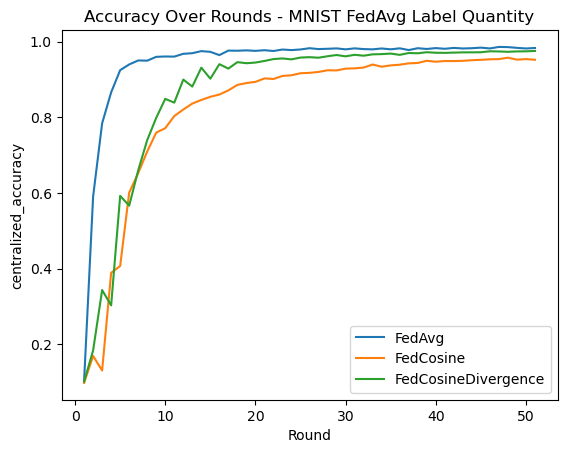

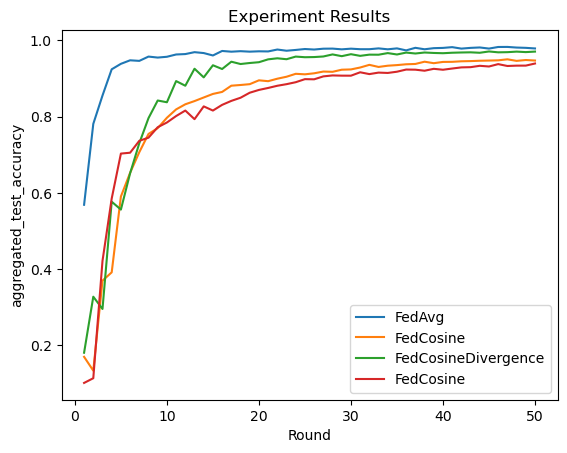

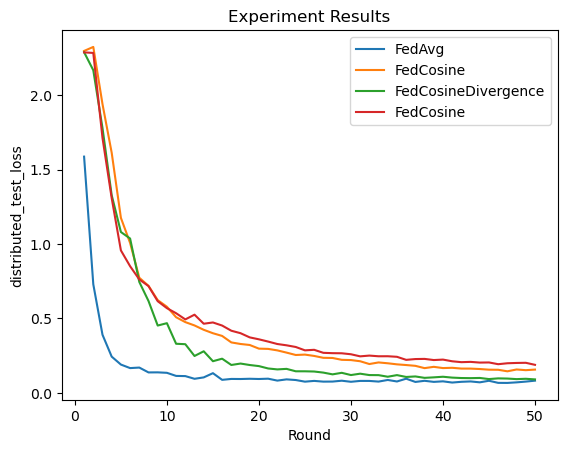

In [50]:
# Define filter criteria
filter_criteria = {
    'dataset': 'mnist',
    'fraction_fit': 0.7,
    'partitioning_type': 'drichlet',
    'total_clients': 20,
    'local_epochs': 1,
    'num_rounds': 50,
    'alpha': 0.2, 
}

# Apply the single filter and plot the results

filtered_experiments = filter_experiments(experiments, filter_criteria)

print(len(filtered_experiments))
plot_centralized_metrics(filtered_experiments, title="Accuracy Over Rounds - MNIST FedAvg Label Quantity")
plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'aggregated_test_accuracy')
plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'distributed_test_loss')

4


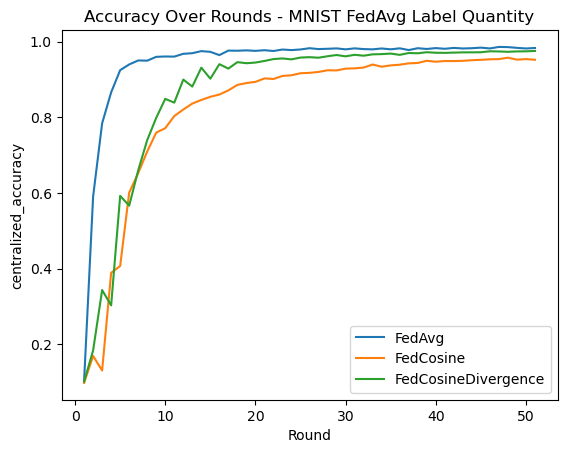

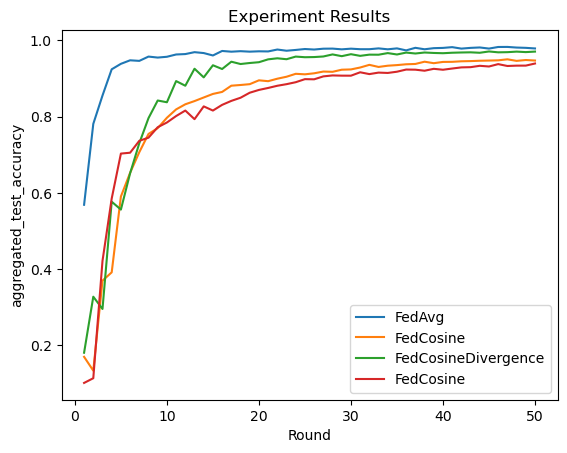

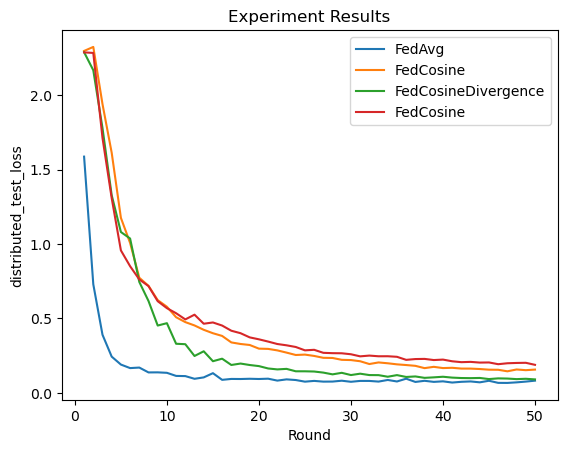

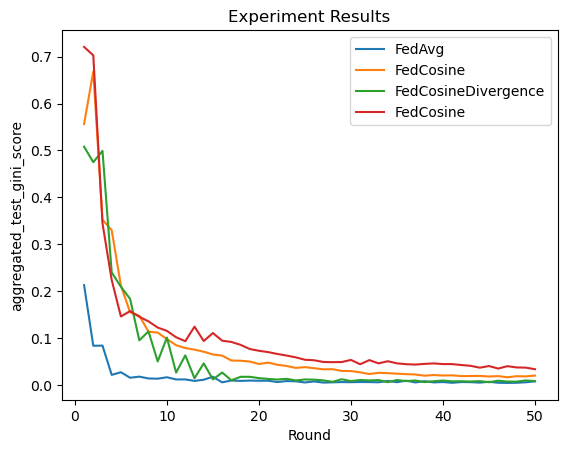

In [55]:
# Define filter criteria
filter_criteria = {
    'dataset': 'mnist',
    'fraction_fit': 0.7,
    'partitioning_type': 'drichlet',
    'total_clients': 20,
    'local_epochs': 1,
    'num_rounds': 50,
    'alpha': 0.2, 
}

# Apply the single filter and plot the results
filtered_experiments = filter_experiments(experiments, filter_criteria)

print(len(filtered_experiments))
plot_centralized_metrics(filtered_experiments, title="Accuracy Over Rounds - MNIST FedAvg Label Quantity")
plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'aggregated_test_accuracy')
plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'distributed_test_loss')
plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'aggregated_test_gini_score')

13


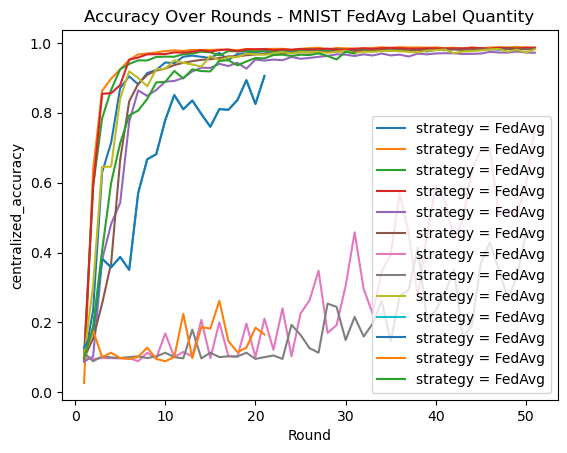

TypeError: 'NoneType' object is not subscriptable

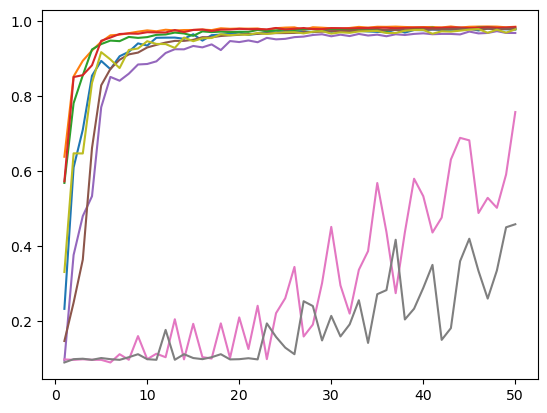

In [30]:
# Define filter criteria
filter_criteria = {
    'dataset': 'mnist',
    'strategy':'FedAvg'
}

# Apply the single filter and plot the results

filtered_experiments = filter_experiments(experiments, filter_criteria)

print(len(filtered_experiments))
plot_centralized_metrics(filtered_experiments, title="Accuracy Over Rounds - MNIST FedAvg Label Quantity")
plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'aggregated_test_accuracy')
plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'distributed_test_loss')

3


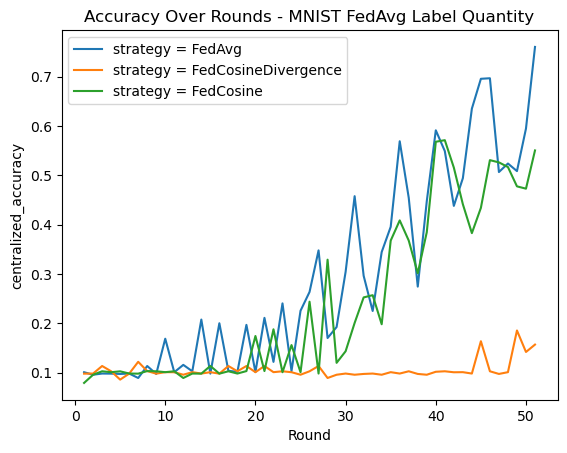

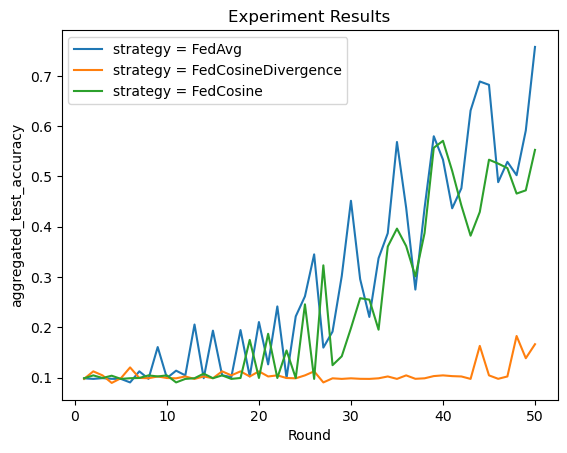

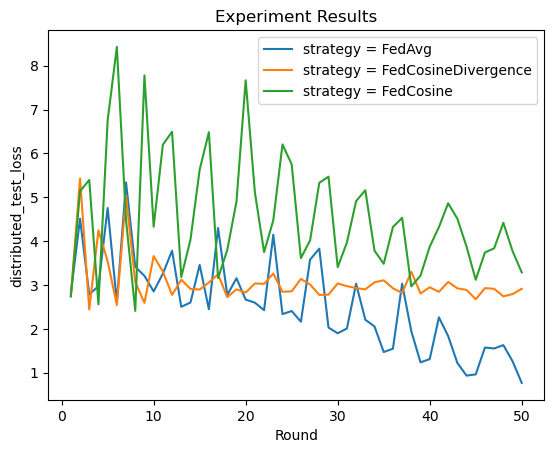

In [31]:
# Define filter criteria
filter_criteria = {
    'dataset': 'mnist',
    'fraction_fit': 0.7,
    'partitioning_type': 'label_quantity',
    'total_clients': 20,
    'local_epochs': 1,
    'num_rounds': 50,
    'labels_per_client': 1, 
}

# Apply the single filter and plot the results

filtered_experiments = filter_experiments(experiments, filter_criteria)

print(len(filtered_experiments))
plot_centralized_metrics(filtered_experiments, title="Accuracy Over Rounds - MNIST FedAvg Label Quantity")
plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'aggregated_test_accuracy')
plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'distributed_test_loss')

3


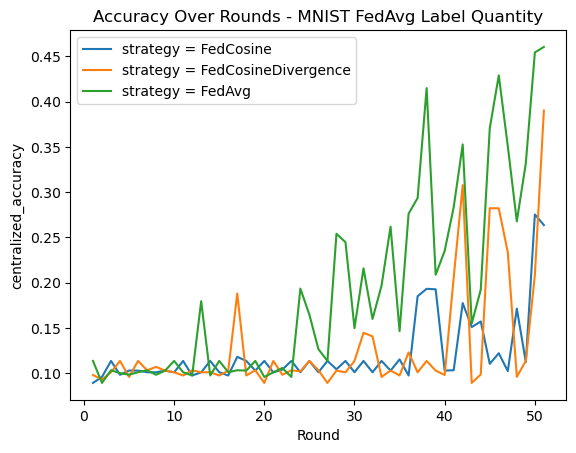

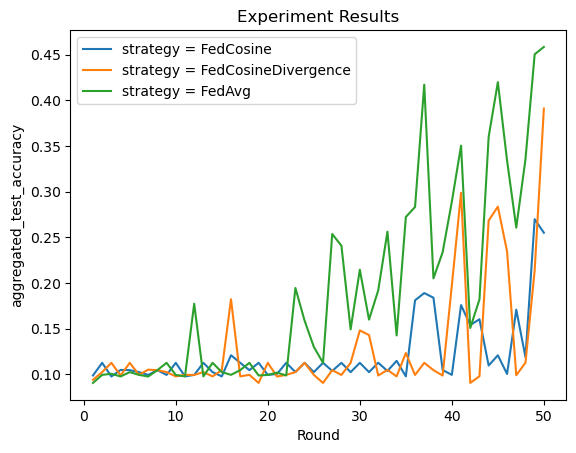

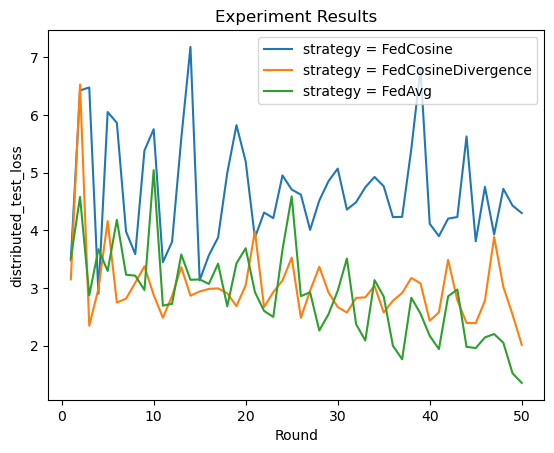

In [32]:
# Define filter criteria
filter_criteria = {
    'dataset': 'mnist',
    'fraction_fit': 0.7,
    'partitioning_type': 'label_quantity',
    'total_clients': 20,
    'local_epochs': 3,
    'num_rounds': 50,
    'labels_per_client': 1, 
}

# Apply the single filter and plot the results

filtered_experiments = filter_experiments(experiments, filter_criteria)

print(len(filtered_experiments))
plot_centralized_metrics(filtered_experiments, title="Accuracy Over Rounds - MNIST FedAvg Label Quantity")
plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'aggregated_test_accuracy')
plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'distributed_test_loss')

3


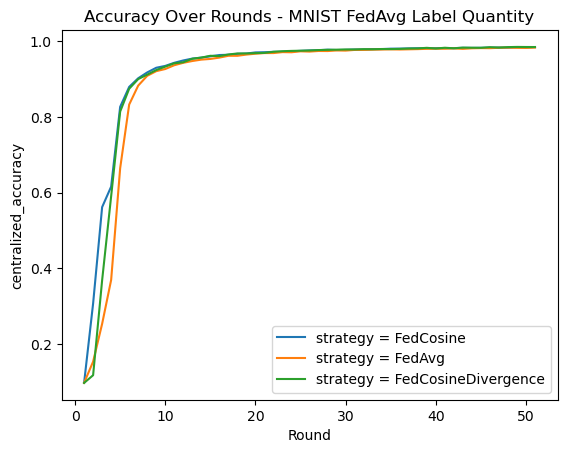

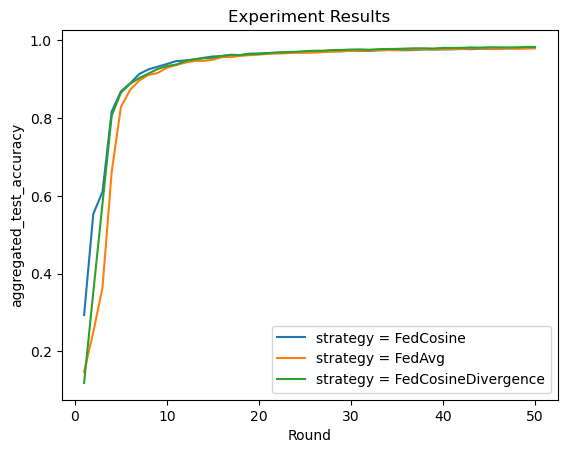

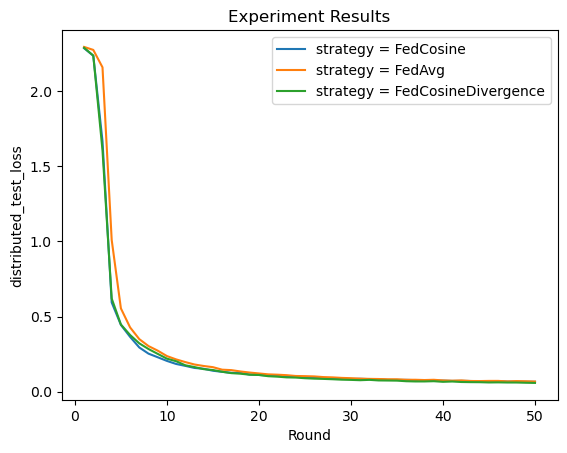

In [33]:
# Define filter criteria
filter_criteria = {
    'dataset': 'mnist',
    'setting': 'iid'   

}

# Apply the single filter and plot the results

filtered_experiments = filter_experiments(experiments, filter_criteria)

print(len(filtered_experiments))
plot_centralized_metrics(filtered_experiments, title="Accuracy Over Rounds - MNIST FedAvg Label Quantity")
plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'aggregated_test_accuracy')
plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'distributed_test_loss')

3


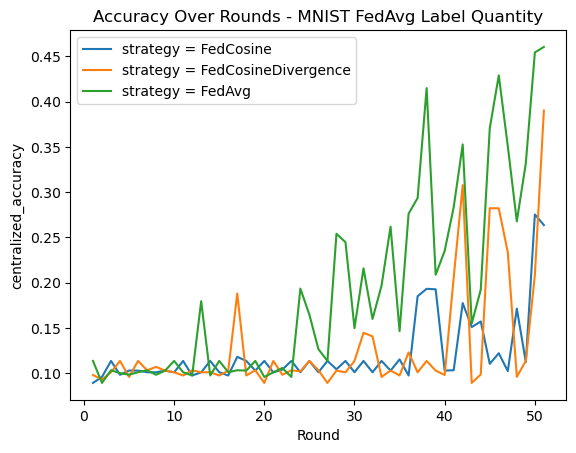

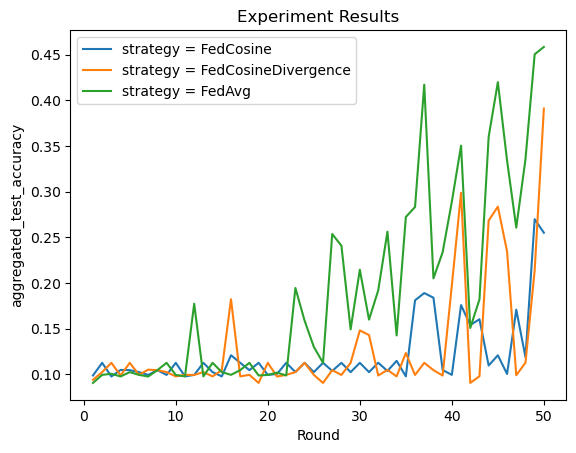

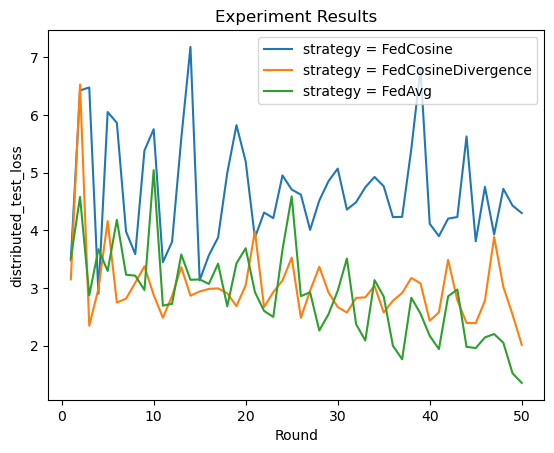

In [34]:
# Define filter criteria
filter_criteria = {
    'dataset': 'mnist',
    'fraction_fit': 0.7,
    'partitioning_type': 'label_quantity',
    'total_clients': 20,
    'local_epochs': 3,
    'num_rounds': 50,
    'labels_per_client': 1, 
}

# Apply the single filter and plot the results

filtered_experiments = filter_experiments(experiments, filter_criteria)

print(len(filtered_experiments))
plot_centralized_metrics(filtered_experiments, title="Accuracy Over Rounds - MNIST FedAvg Label Quantity")
plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'aggregated_test_accuracy')
plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'distributed_test_loss')

In [ ]:
# Define filter criteria
filter_criteria = {
    'dataset': 'mnist',
    'fraction_fit': 0.7,
    'partitioning_type': 'drichlet',
    'total_clients': 20,
    'local_epochs': 3,
    'num_rounds': 50,
    'labels_per_client': 1, 
}

# Apply the single filter and plot the results

filtered_experiments = filter_experiments(experiments, filter_criteria)

print(len(filtered_experiments))
plot_centralized_metrics(filtered_experiments, title="Accuracy Over Rounds - MNIST FedAvg Label Quantity")
plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'aggregated_test_accuracy')
plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'distributed_test_loss')

4


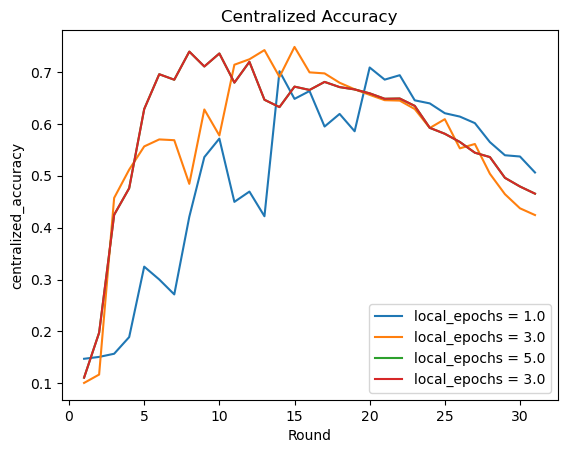

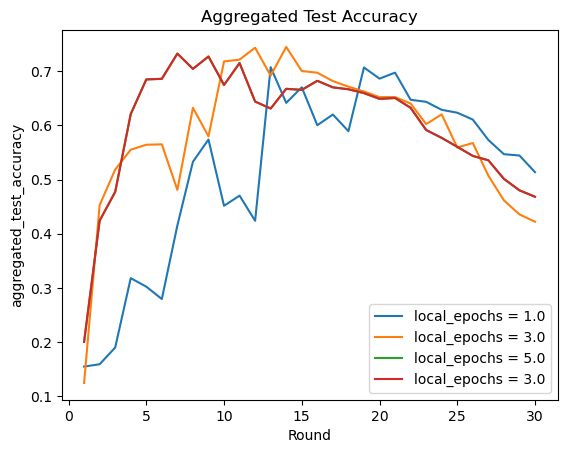

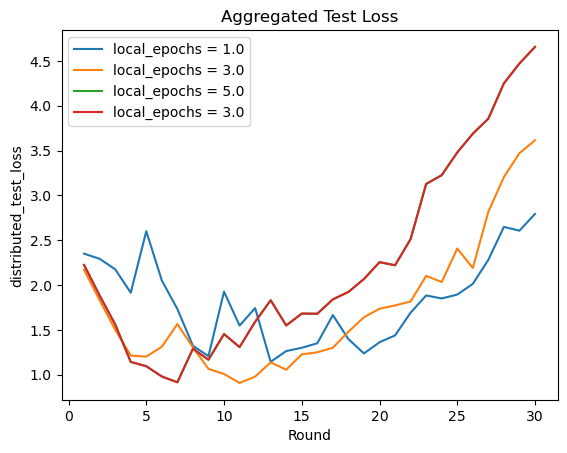

In [35]:

# Define filter criteria
filter_criteria = {
    'dataset': 'mnist',
    'partitioning_type': 'label_quantity',
    'total_clients': 20,
    'num_rounds': 30,
    'labels_per_client': 2, 
}

# Apply the single filter and plot the results

filtered_experiments = filter_experiments(experiments, filter_criteria)

print(len(filtered_experiments))
plot_centralized_metrics(filtered_experiments, title="Centralized Accuracy", label_attr = 'local_epochs' )
plot_distributed_metrics(filtered_experiments, title="Aggregated Test Accuracy", metric = 'aggregated_test_accuracy', label_attr = 'local_epochs')
plot_distributed_metrics(filtered_experiments, title="Aggregated Test Loss", metric = 'distributed_test_loss', label_attr = 'local_epochs')

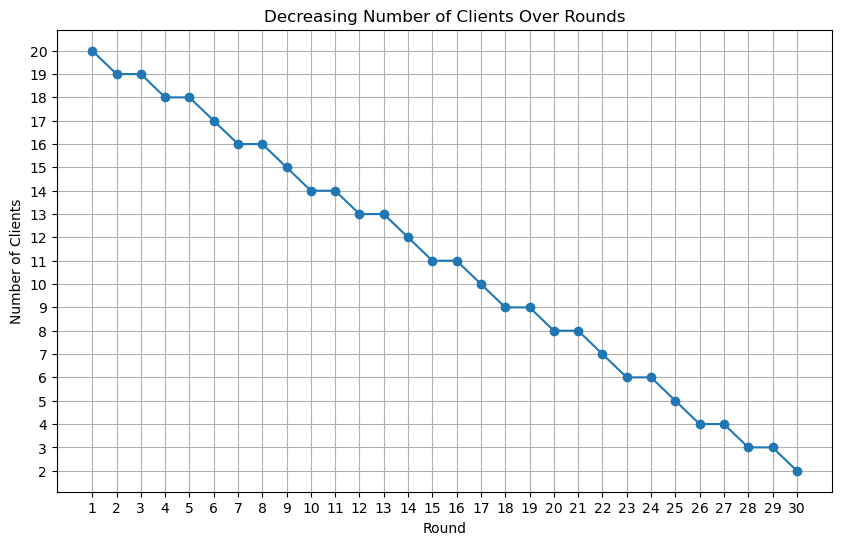

In [34]:
import matplotlib.pyplot as plt
import numpy as np

# Define the number of rounds and initial/final number of clients
rounds = np.arange(1, 31)  # Rounds from 1 to 30
initial_clients = 20
final_clients = 2

# Calculate the number of clients for each round (linear decrease) and round to integers
clients_per_round = np.linspace(initial_clients, final_clients, len(rounds))
clients_per_round = np.round(clients_per_round).astype(int)  # Round to the nearest integer and convert to int

# Plotting the decreasing number of clients over rounds
plt.figure(figsize=(10, 6))
plt.plot(rounds, clients_per_round, marker='o')
plt.title("Decreasing Number of Clients Over Rounds")
plt.xlabel("Round")
plt.ylabel("Number of Clients")
plt.grid(True)
plt.xticks(rounds)  # To show all rounds on the x-axis

# Set y-axis ticks to integers only
plt.yticks(np.arange(final_clients, initial_clients + 1, 1))

plt.show()


2


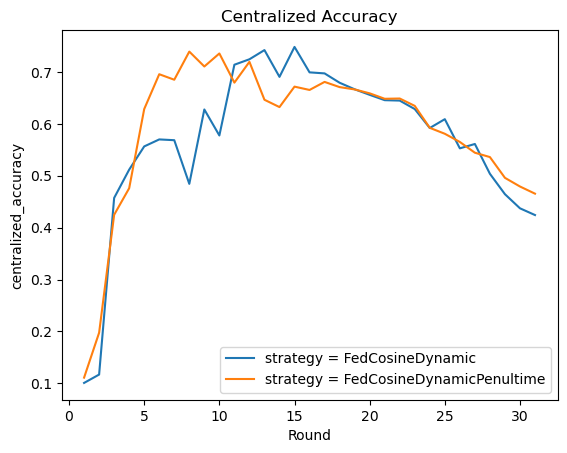

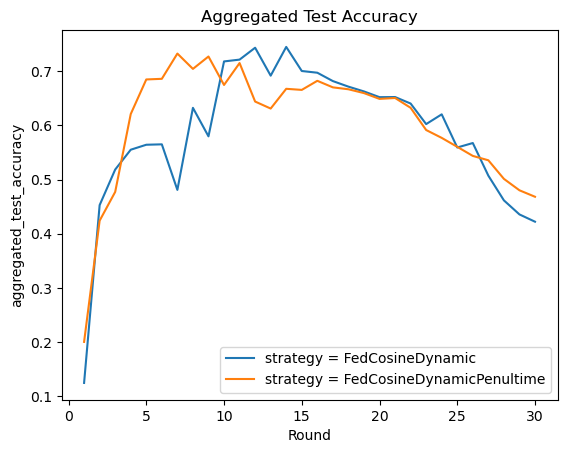

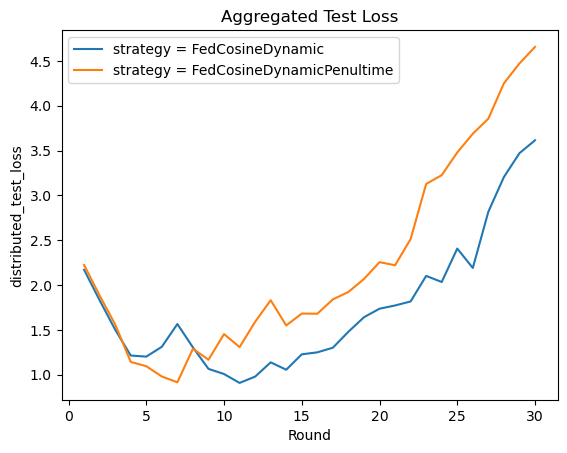

In [36]:
# Define filter criteria
filter_criteria = {
    'dataset': 'mnist',
    'partitioning_type': 'label_quantity',
    'total_clients': 20,
    'num_rounds': 30,
    'labels_per_client': 2,
    'local_epochs': 3 
}

# Apply the single filter and plot the results

filtered_experiments = filter_experiments(experiments, filter_criteria)

print(len(filtered_experiments))
plot_centralized_metrics(filtered_experiments, title="Centralized Accuracy", label_attr = 'strategy' )
plot_distributed_metrics(filtered_experiments, title="Aggregated Test Accuracy", metric = 'aggregated_test_accuracy', label_attr = 'strategy')
plot_distributed_metrics(filtered_experiments, title="Aggregated Test Loss", metric = 'distributed_test_loss', label_attr = 'strategy')

2


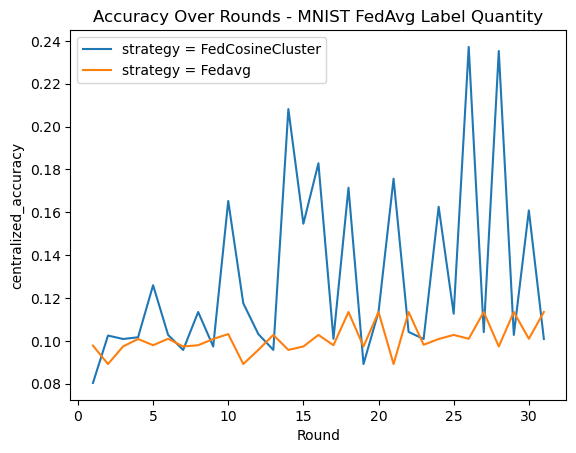

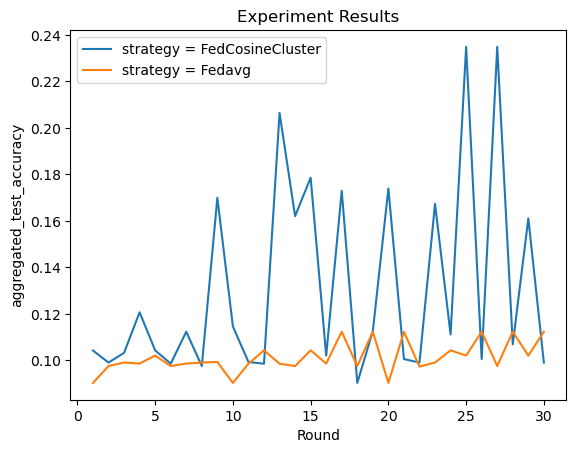

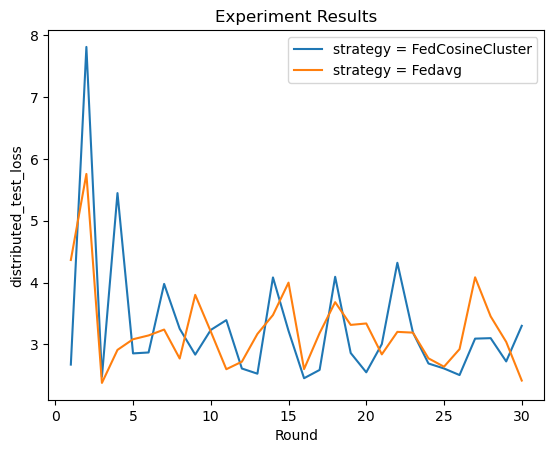

In [4]:

# Define filter criteria
filter_criteria = {
    'dataset': 'mnist',
    'partitioning_type': 'label_quantity',
    'total_clients': 30,
    'labels_per_client': 1 
}

# Apply the single filter and plot the results

filtered_experiments = filter_experiments(experiments, filter_criteria)

print(len(filtered_experiments))
plot_centralized_metrics(filtered_experiments, title="Accuracy Over Rounds - MNIST FedAvg Label Quantity")
plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'aggregated_test_accuracy')
plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'distributed_test_loss')

2


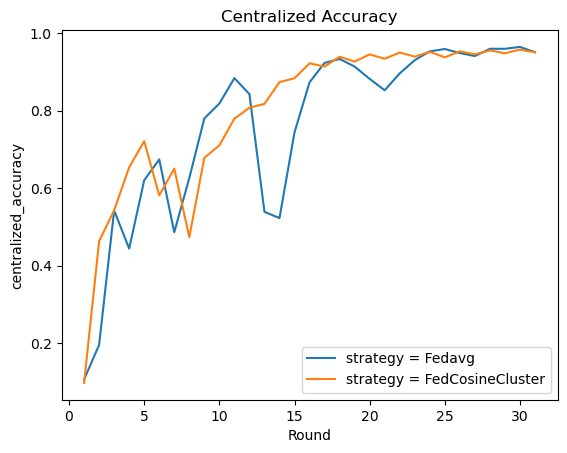

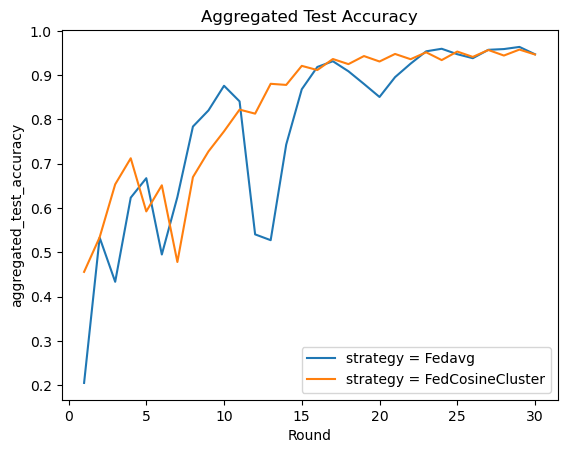

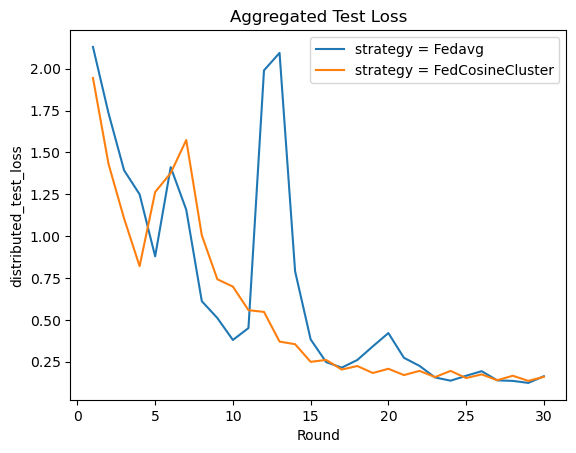

In [38]:

# Define filter criteria
filter_criteria = {
    'dataset': 'mnist',
    'partitioning_type': 'label_groups',
    
}

# Apply the single filter and plot the results

filtered_experiments = filter_experiments(experiments, filter_criteria)

print(len(filtered_experiments))

plot_centralized_metrics(filtered_experiments, title="Centralized Accuracy", label_attr = 'strategy' )
plot_distributed_metrics(filtered_experiments, title="Aggregated Test Accuracy", metric = 'aggregated_test_accuracy', label_attr = 'strategy')
plot_distributed_metrics(filtered_experiments, title="Aggregated Test Loss", metric = 'distributed_test_loss', label_attr = 'strategy')

6


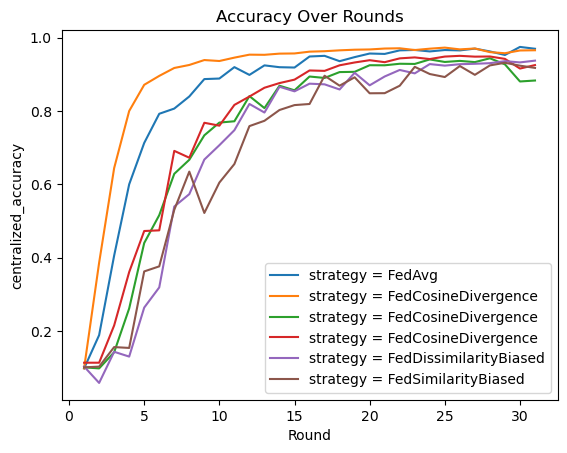

In [48]:

# Define filter criteria
filter_criteria = {
    'dataset': 'mnist',
    'partitioning_type': 'drichlet',
    'total_clients': 30,
    'local_epochs': 2,
    'num_rounds': 30,
}

# Apply the single filter and plot the results

filtered_experiments = filter_experiments(experiments, filter_criteria)

print(len(filtered_experiments))
plot_centralized_metrics(filtered_experiments, title="Accuracy Over Rounds")
#plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'aggregated_test_accuracy')
#plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'distributed_test_loss')

2


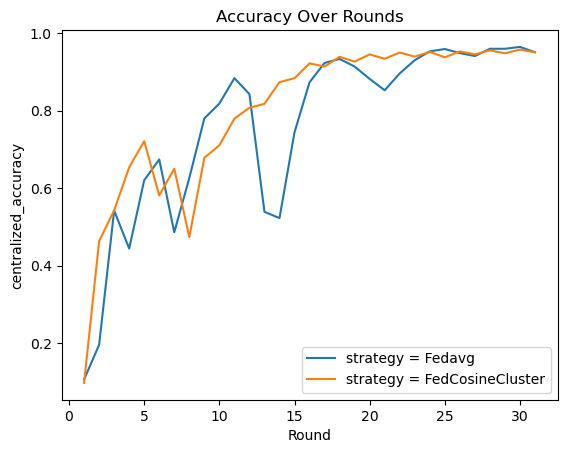

In [6]:
# Define filter criteria
filter_criteria = {
    'dataset': 'mnist',
    'partitioning_type': 'label_groups',

}

# Apply the single filter and plot the results

filtered_experiments = filter_experiments(experiments, filter_criteria)

print(len(filtered_experiments))
plot_centralized_metrics(filtered_experiments, title="Accuracy Over Rounds")

2


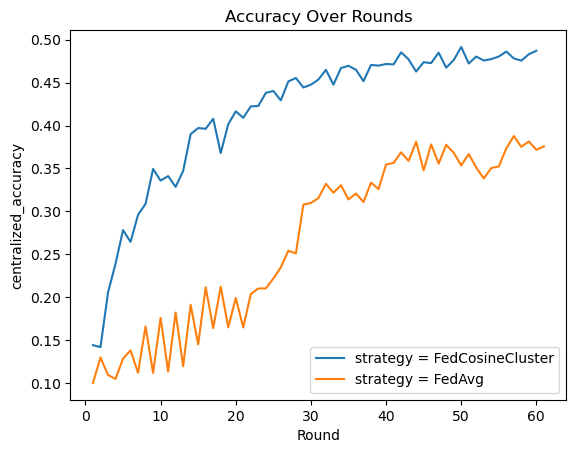

In [12]:
# Define filter criteria
filter_criteria = {
    'dataset': 'cifar10',
    'partitioning_type': 'label_groups',

}

# Apply the single filter and plot the results

filtered_experiments = filter_experiments(experiments, filter_criteria)

print(len(filtered_experiments))
plot_centralized_metrics(filtered_experiments, title="Accuracy Over Rounds")

3


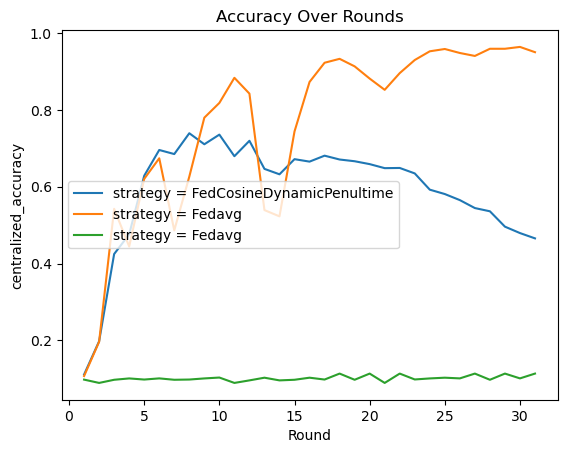

In [14]:
# Define filter criteria
filter_criteria = {
    'ID':[34,35]

}

# Apply the single filter and plot the results

filtered_experiments = filter_experiments(experiments, filter_criteria)

print(len(filtered_experiments))
plot_centralized_metrics(filtered_experiments, title="Accuracy Over Rounds")

4


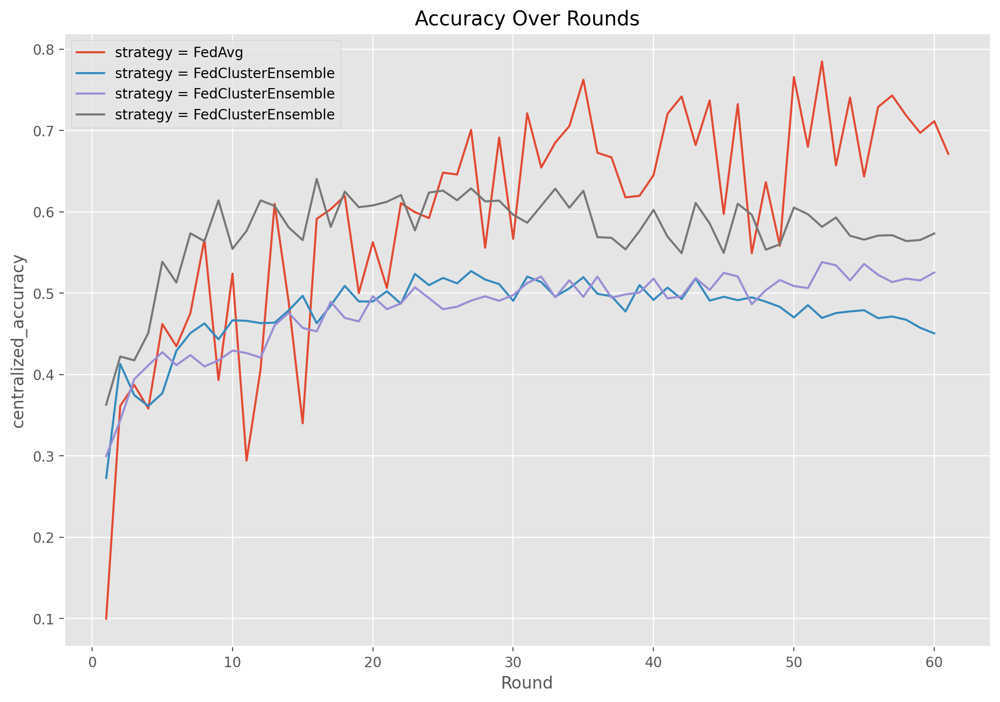

In [100]:
# Define filter criteria
filter_criteria = {
    'dataset': 'fmnist'

}

# Apply the single filter and plot the results

filtered_experiments = filter_experiments(experiments, filter_criteria)

print(len(filtered_experiments))
plot_centralized_metrics(filtered_experiments, title="Accuracy Over Rounds")

6


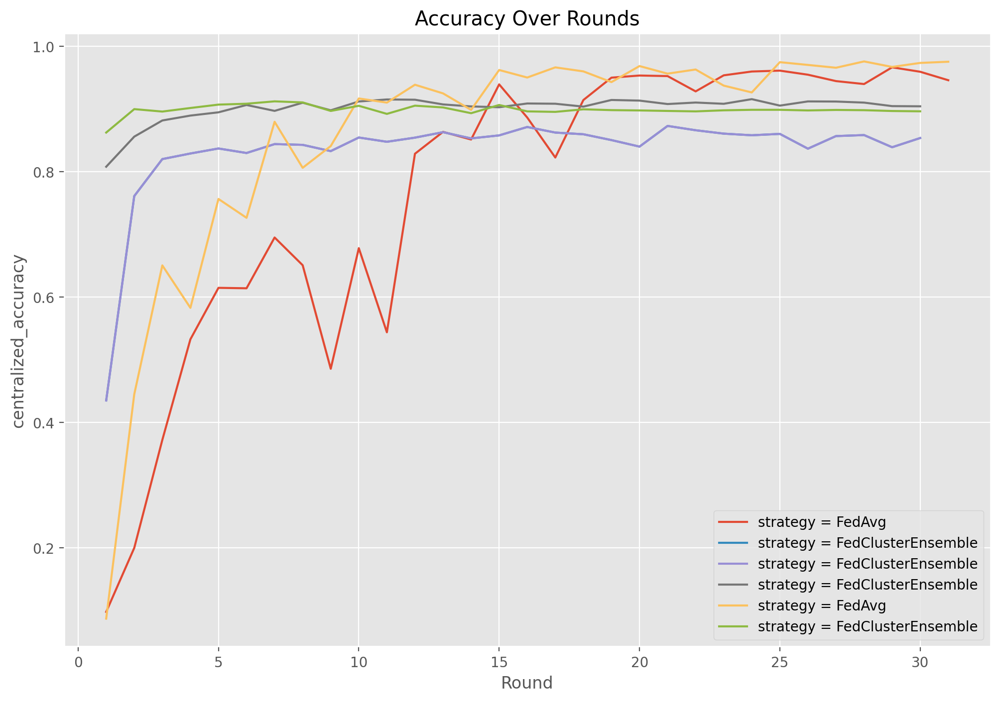

In [95]:
# Define filter criteria
filter_criteria = {
    'ID': [62,63,64,66,68,69]

}

# Apply the single filter and plot the results

filtered_experiments = filter_experiments(experiments, filter_criteria)

print(len(filtered_experiments))
plot_centralized_metrics(filtered_experiments, title="Accuracy Over Rounds")

3


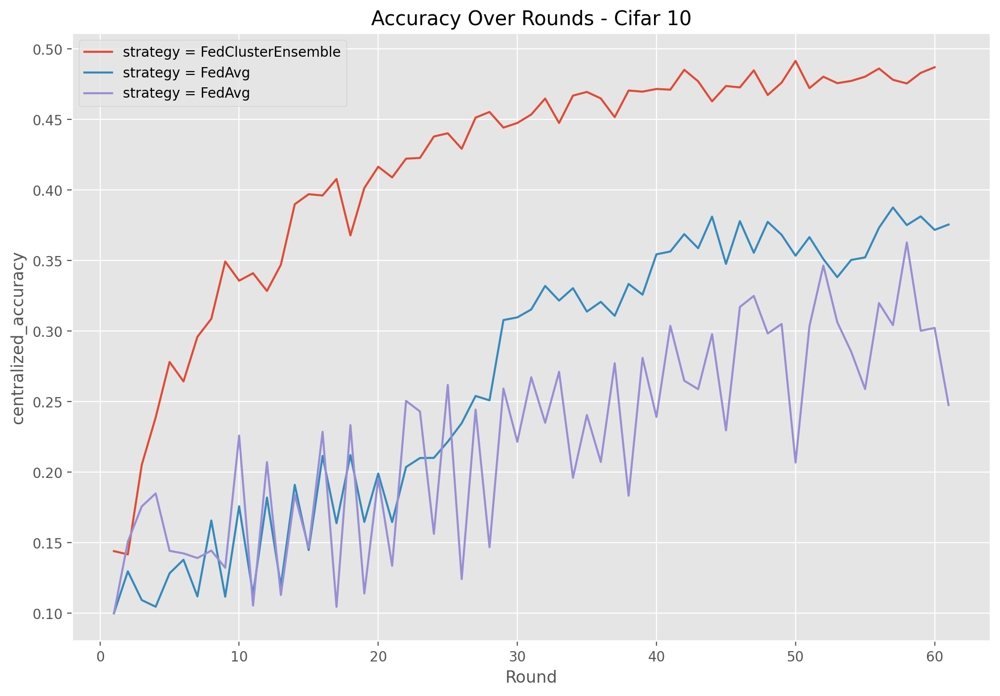

In [89]:
# Define filter criteria
filter_criteria = {
    'ID': [52,53,58]

}

# Apply the single filter and plot the results

filtered_experiments = filter_experiments(experiments, filter_criteria)

print(len(filtered_experiments))
plot_centralized_metrics(filtered_experiments, title="Accuracy Over Rounds - Cifar 10")

2


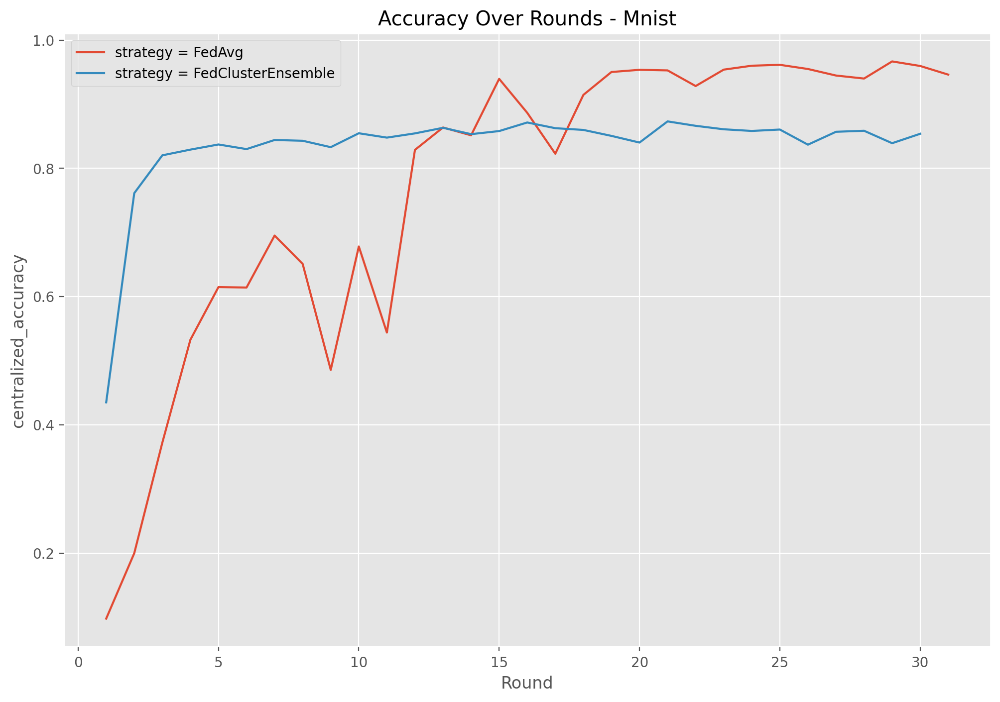

In [105]:
# Define filter criteria
filter_criteria = {
    'ID': [62,63]

}

# Apply the single filter and plot the results

filtered_experiments = filter_experiments(experiments, filter_criteria)

print(len(filtered_experiments))
plot_centralized_metrics(filtered_experiments, title="Accuracy Over Rounds - Mnist")

2


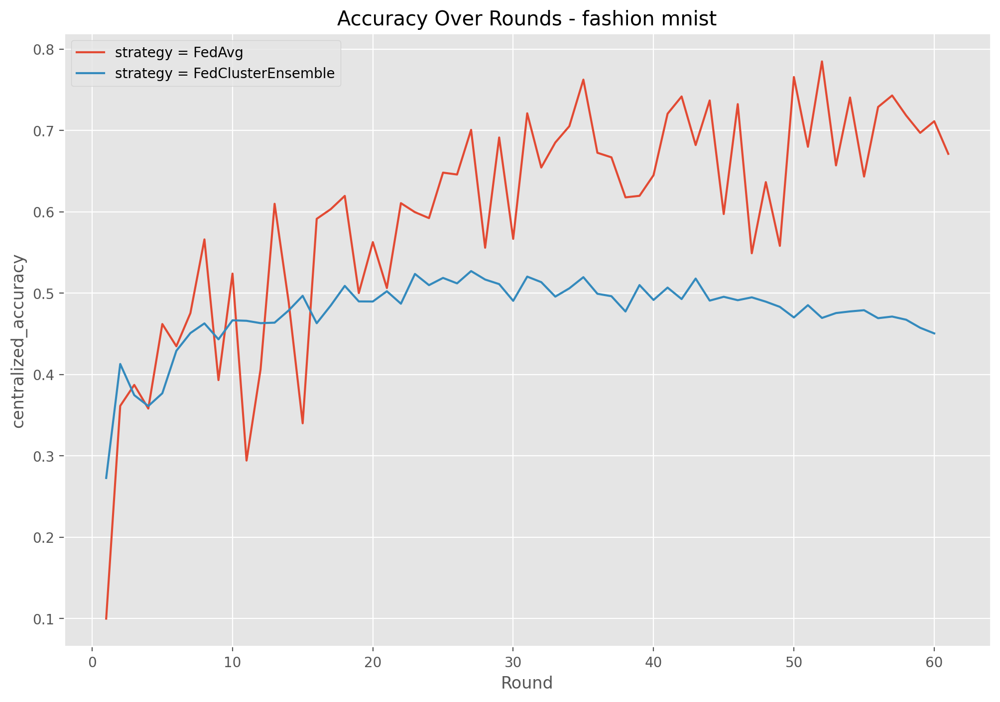

In [107]:
# Define filter criteria
filter_criteria = {
    'ID': [59,60]

}

# Apply the single filter and plot the results

filtered_experiments = filter_experiments(experiments, filter_criteria)

print(len(filtered_experiments))
plot_centralized_metrics(filtered_experiments, title="Accuracy Over Rounds - fashion mnist")

In [77]:
import pandas as pd
import matplotlib.pyplot as plt
import os

def plot_cluster_losses(output_path, title = 'Accuracy Over Rounds', save_path=None):
    """
    Reads the cluster losses from a CSV file named 'cluster_losses.csv' in the specified output folder
    and plots them in a single plot.

    Parameters:
    - output_path: str, path to the folder containing 'cluster_losses.csv'.
    - save_path: str, optional path to save the plot image.

    The CSV file is expected to have:
    - A column named 'round' indicating the round numbers.
    - Other columns containing cluster loss values for each cluster.
    """
    # Construct the path to the CSV file
    csv_file_path = os.path.join(output_path, 'cluster_losses.csv')

    # Check if the file exists
    if not os.path.exists(csv_file_path):
        print(f"CSV file '{csv_file_path}' not found.")
        return

    # Read the CSV file into a DataFrame
    df = pd.read_csv(csv_file_path)

    # Ensure 'round' column exists
    if 'round' not in df.columns:
        print("The CSV file must contain a 'round' column.")
        return

    # Get the list of columns to plot (all columns except 'round')
    columns_to_plot = df.columns.drop('round')

    # Plotting
    plt.figure(figsize=(10, 6))
    plt.style.use('seaborn-darkgrid')

    for col in columns_to_plot:
        plt.plot(df['round'], df[col], marker='o', label=col)

    plt.xlabel('Round')
    plt.ylabel('Loss')
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path)
        print(f"Plot saved to {save_path}")
    plt.show()


In [33]:
import pandas as pd
import matplotlib.pyplot as plt
import os

def plot_cluster_losses(output_path, title = 'Accuracy Over Rounds', save_path=None):
    """
    Reads the cluster losses from a CSV file named 'cluster_losses.csv' in the specified output folder
    and plots them in a single plot.

    Parameters:
    - output_path: str, path to the folder containing 'cluster_losses.csv'.
    - save_path: str, optional path to save the plot image.

    The CSV file is expected to have:
    - A column named 'round' indicating the round numbers.
    - Other columns containing cluster loss values for each cluster.
    """
    # Construct the path to the CSV file
    csv_file_path = os.path.join(output_path, 'cluster_losses.csv')

    # Check if the file exists
    if not os.path.exists(csv_file_path):
        print(f"CSV file '{csv_file_path}' not found.")
        return

    # Read the CSV file into a DataFrame
    df = pd.read_csv(csv_file_path)

    # Ensure 'round' column exists
    if 'round' not in df.columns:
        print("The CSV file must contain a 'round' column.")
        return

    # Get the list of columns to plot (all columns except 'round')
    columns_to_plot = df.columns.drop('round')

    # Plotting
    plt.figure(figsize=(12, 8), dpi=300)
    plt.style.use('ggplot')

    for col in columns_to_plot:
        plt.plot(df['round'], df[col], label=col)

    plt.xlabel('Round')
    plt.ylabel('Loss')
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()

    plt.show()


In [103]:
# Define filter criteria
filter_criteria = {
    'ID': [63]

}

# Apply the single filter and plot the results

filtered_experiments = filter_experiments(experiments, filter_criteria)
print(len(filtered_experiments))

1


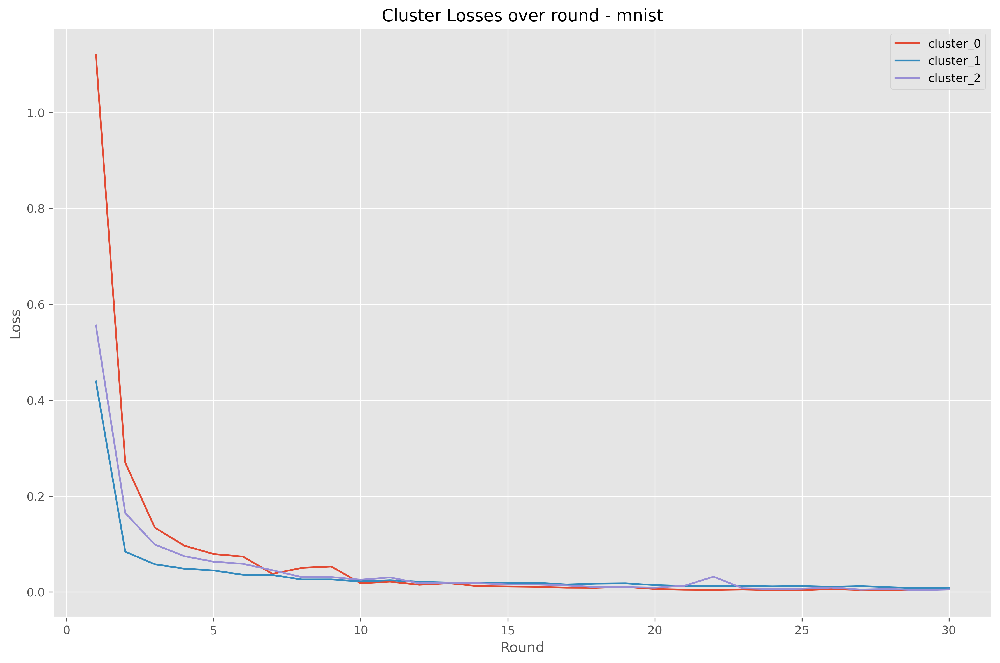

In [104]:

plot_cluster_losses(filtered_experiments[0].output_folder, title = 'Cluster Losses over round - mnist')


1


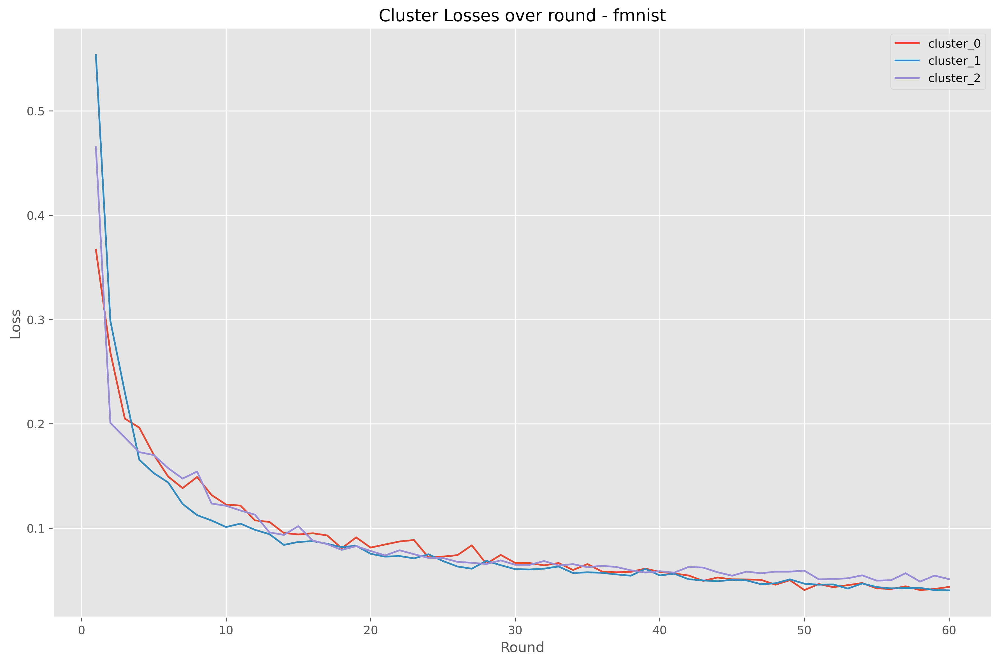

In [109]:
# Define filter criteria
filter_criteria = {
    'ID': [60]

}

# Apply the single filter and plot the results

filtered_experiments = filter_experiments(experiments, filter_criteria)
print(len(filtered_experiments))


plot_cluster_losses(filtered_experiments[0].output_folder, title = 'Cluster Losses over round - fmnist')

1
Index(['round', 'fraction_fit', 'distributed_accuracy', 'process_variable',
       'setpoint'],
      dtype='object')


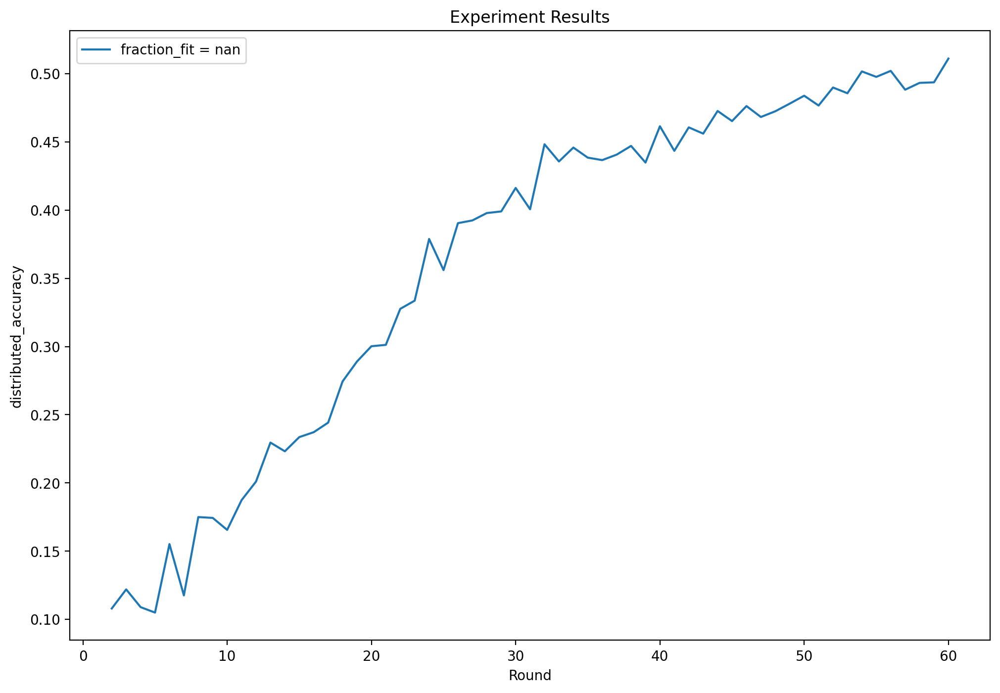

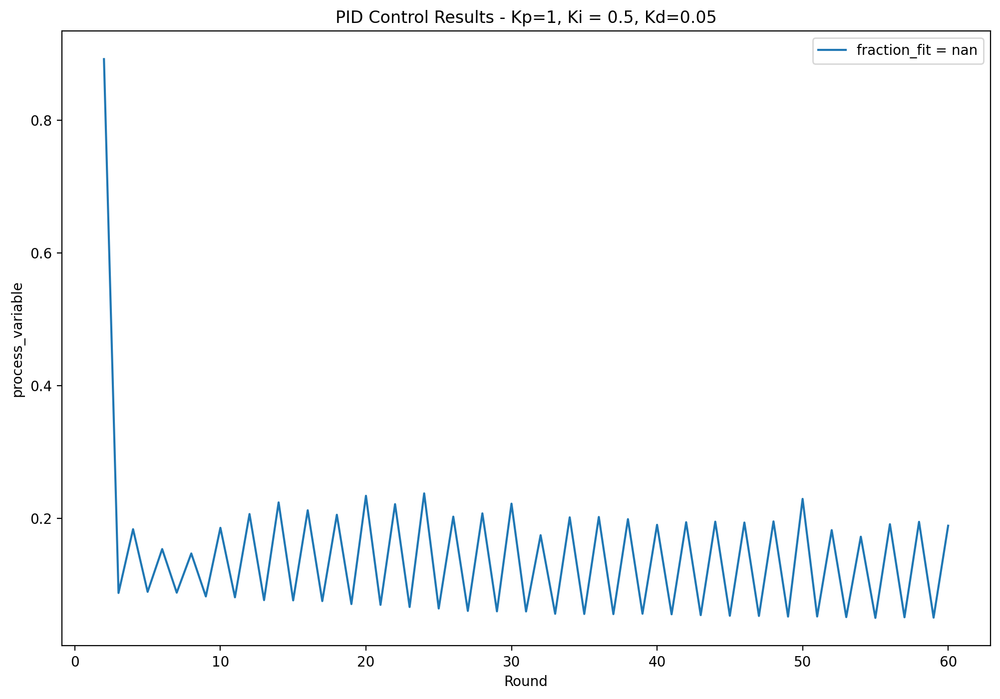

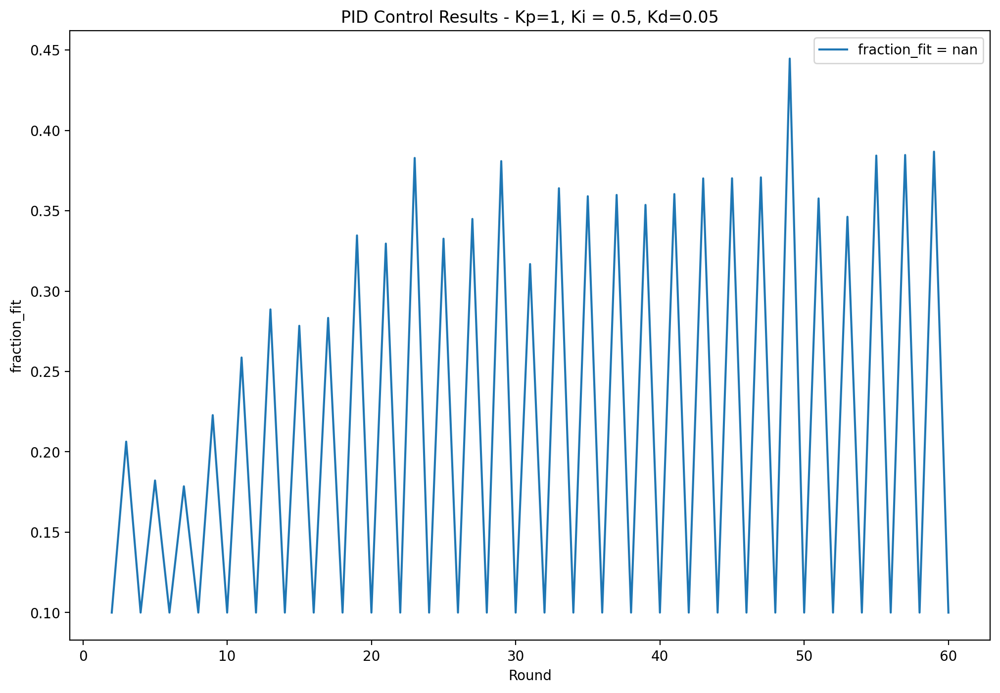

In [74]:
import pandas as pd
# Define filter criteria
filter_criteria = {
    'dataset': 'cifar10',
    'strategy': 'FedPid', 
    'ID':79
}

def plot_pid_metrics(experiments, title="Experiment Results", metric = 'distributed_accuracy', label_attr = 'fraction_fit'):
    exp_strategy_cnt = {}
    
    # Create a new figure with the specified size and DPI
    figsize=(12, 8)
    plt.figure(figsize=figsize, dpi=200)
    for exp in experiments:
        if exp.centralized_metrics is not None:
             # Generate a sequence of increasing values starting from 1
            rounds = exp.pid_metrics['round']
            label = getattr(exp, label_attr, 'Unknown')
            plt.plot(rounds, exp.pid_metrics[metric], label=f"{label_attr} = {label}")
            #exp_strategy_cnt[exp.strategy] = exp_strategy_cnt.get(exp.strategy, 0) + 1

    plt.title(title)
    plt.xlabel("Round")
    plt.ylabel(metric)
    plt.legend()
    plt.show()

# Apply the single filter and plot the results

filtered_experiments = filter_experiments(experiments, filter_criteria)

print(len(filtered_experiments))


for exp in filtered_experiments:
    
    exp.pid_metrics = pd.read_csv(f"{exp.output_folder}/pid_metrics.csv")
    print(exp.pid_metrics.columns)  # Check the column names
    
    
plot_pid_metrics(filtered_experiments, title="Experiment Results", metric = 'distributed_accuracy', label_attr = 'fraction_fit')

plot_pid_metrics(filtered_experiments, title="PID Control Results - Kp=1, Ki = 0.5, Kd=0.05", metric = 'process_variable', label_attr = 'fraction_fit')

plot_pid_metrics(filtered_experiments, title="PID Control Results - Kp=1, Ki = 0.5, Kd=0.05", metric = 'fraction_fit', label_attr = 'fraction_fit')
    


1


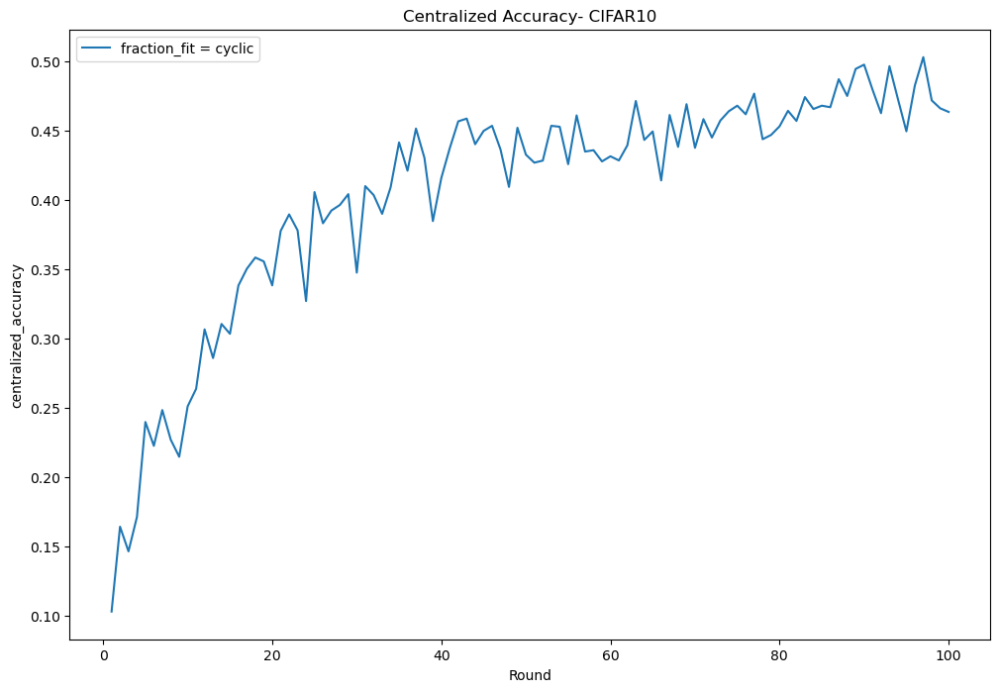

In [77]:
# Define filter criteria
filter_criteria = {
    'dataset': 'cifar10',
    'partitioning_type': 'label_groups',
    'strategy': 'FedClusterEnsemble',
    'num_rounds': 100,
    

}

# Apply the single filter and plot the results
filtered_experiments = filter_experiments(experiments, filter_criteria)

print(len(filtered_experiments))
plot_centralized_metrics(filtered_experiments, title="Centralized Accuracy- CIFAR10", label_attr = 'fraction_fit')

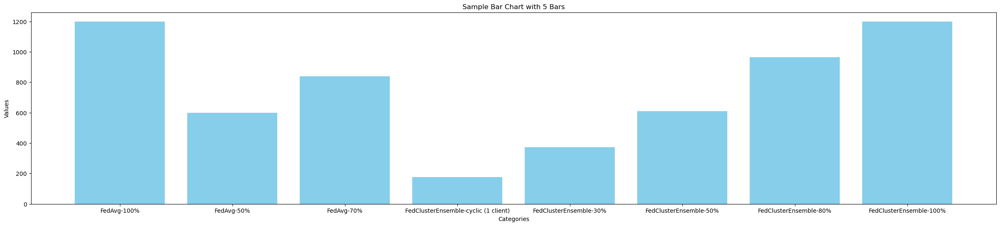

[1200, 600.0, 840.0, 177, 374.0, 610.0, 964.0, 1200]


In [44]:
import matplotlib.pyplot as plt

# Sample data for the bar chart
categories = ['FedAvg-100%','FedAvg-50%', 'FedAvg-70%', 'FedClusterEnsemble-cyclic (1 client)','FedClusterEnsemble-30%', 'FedClusterEnsemble-50%', 'FedClusterEnsemble-80%', 'FedClusterEnsemble-100%', ]

num_rounds = 60
total_clients = 20

fedavg100 = 1*num_rounds*total_clients

fedavg50 = 0.5*num_rounds*total_clients

fedavg70 = 0.7*num_rounds*total_clients

fedclustercyclic=3*(num_rounds-1)

fedcluster30=0.3*(num_rounds-1)*total_clients + 20

fedcluster50=0.5*(num_rounds-1)*total_clients + 20

fedcluster80=0.8*(num_rounds-1)*total_clients + 20

fedcluster100=1*(num_rounds-1)*total_clients + 20




values = [fedavg100, fedavg50, fedavg70, fedclustercyclic, fedcluster30,fedcluster50,fedcluster80,fedcluster100]

# Create the bar chart
plt.figure(figsize=(30, 6))
plt.bar(categories, values, color='skyblue')

# Adding title and labels
plt.title('Sample Bar Chart with 5 Bars')
plt.xlabel('Categories')
plt.ylabel('Values')

# Display the bar chart
plt.show()

print(values)

1


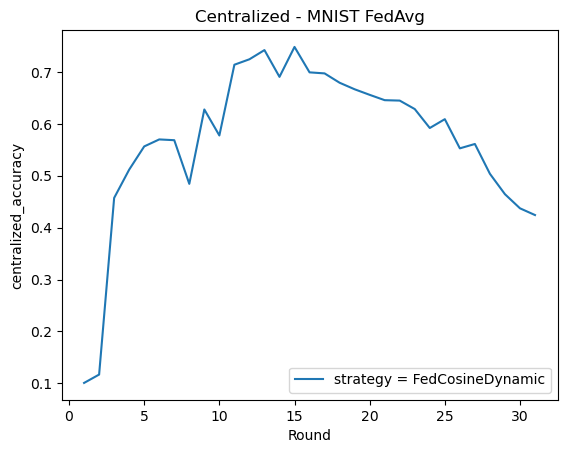

   Start Round  End Round     Trend  Intensity (avg change)  Clients at Start  \
0            1          8  Increase                  0.0730                19   
1           10         14  Increase                  0.0086                14   
2           15         30  Decrease                 -0.0183                11   

   Clients at End  
0              15  
1              11  
2               2  


In [63]:
# Define filter criteria
filter_criteria = {
    'ID': [32]

}

# Apply the single filter and plot the results
filtered_experiments = filter_experiments(experiments, filter_criteria)

print(len(filtered_experiments))
plot_centralized_metrics(filtered_experiments, title="Centralized - MNIST FedAvg", label_attr = 'strategy')

experiment=filtered_experiments[0]
# Sample data from your experiment
data = experiment.centralized_metrics['centralized_accuracy']

# Increase the window size for the moving average
window_size = 5  # Increased window size for more smoothing
smoothed_data = data.rolling(window=window_size, min_periods=1).mean()

# Apply a larger threshold to avoid detecting minor fluctuations
threshold = 0.005  # Adjust the threshold to be less sensitive
smoothed_diff = smoothed_data.diff().fillna(0)
trend_direction = smoothed_diff.apply(lambda x: 'Increase' if x > threshold else 'Decrease')

# Identify periods of continuous increase or decrease
trend_periods = []
start_round = 0
current_trend = trend_direction.iloc[0]

for i in range(1, len(trend_direction)):
    if trend_direction.iloc[i] != current_trend:
        # Calculate intensity (average change per round) using original data
        intensity = data[start_round:i].diff().mean()
        
        # Only add the trend if it's not a single-round interval
        if (i - 1 > start_round) and not pd.isna(intensity):
            # Calculate the number of clients at the start and end of the interval
            clients_at_start = int(start_clients - alfa * start_round)
            clients_at_end = int(start_clients - alfa * (i - 1))
            
            # Store the trend period
            trend_periods.append({
                "Start Round": start_round,
                "End Round": i - 1,
                "Trend": current_trend,
                "Intensity (avg change)": round(intensity, 4),
                "Clients at Start": clients_at_start,
                "Clients at End": clients_at_end
            })
        
        # Update for the next period
        start_round = i
        current_trend = trend_direction.iloc[i]

# Append the last identified trend (if not a single-round interval)
intensity = data[start_round:].diff().mean()
clients_at_start = int(start_clients - alfa * start_round)
clients_at_end = int(start_clients - alfa * (len(data) - 1))
if (len(data) - 1 > start_round) and not pd.isna(intensity):
    trend_periods.append({
        "Start Round": start_round,
        "End Round": len(data) - 1,
        "Trend": current_trend,
        "Intensity (avg change)": round(intensity, 4),
        "Clients at Start": clients_at_start,
        "Clients at End": clients_at_end
})

# Create a DataFrame for the trend periods
trend_table = pd.DataFrame(trend_periods)

# Display the updated table
print(trend_table)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


0


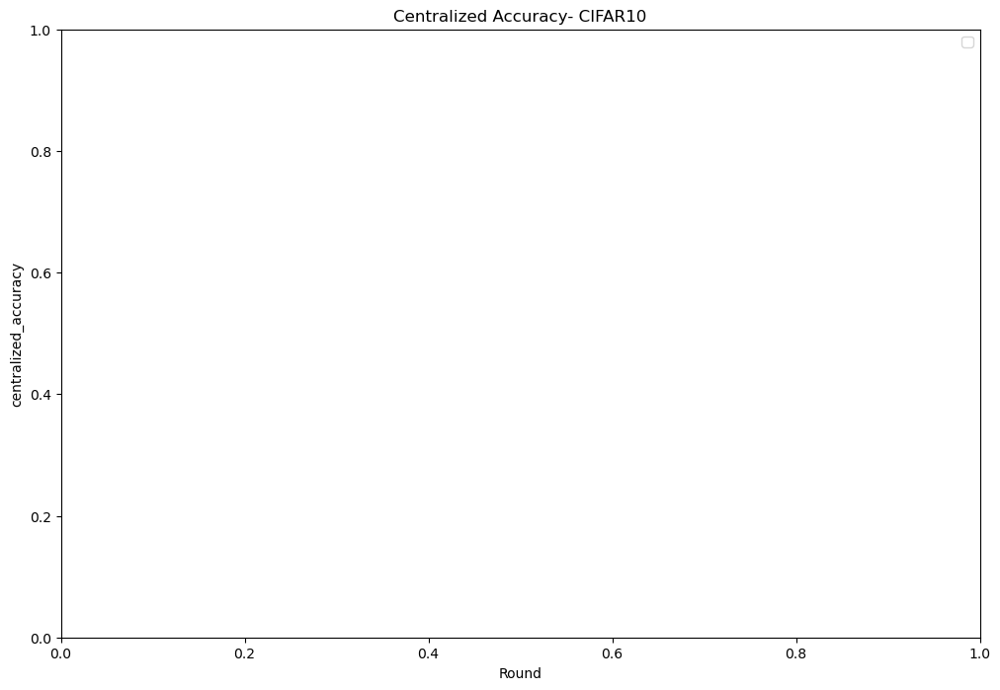

In [10]:

# Define filter criteria
filter_criteria = {
    'dataset': 'cifar10',
    'fraction_fit': 0.7,
    'partitioning_type': 'label_groups',
    'total_clients': 10,
    'local_epochs': 2,
    'num_rounds':60,
}

# Apply the single filter and plot the results

filtered_experiments = filter_experiments(experiments, filter_criteria)

print(len(filtered_experiments))

plot_centralized_metrics(filtered_experiments, title="Centralized Accuracy- CIFAR10", label_attr = 'strategy')


2


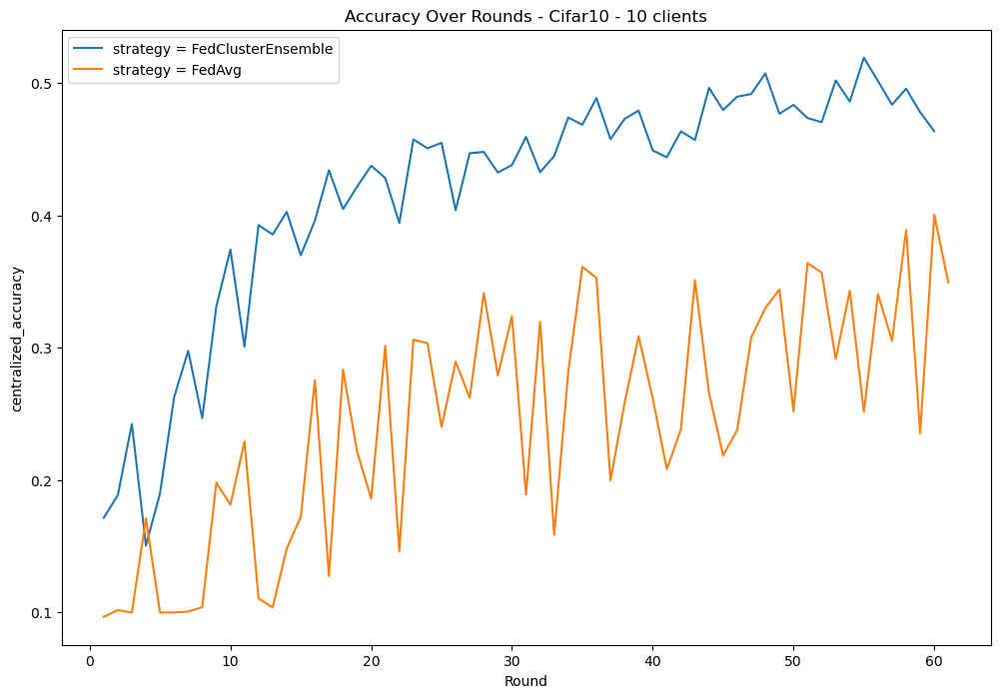

In [9]:

# Define filter criteria
filter_criteria = {
    'ID': [85,91]
}

# Apply the single filter and plot the results

filtered_experiments = filter_experiments(experiments, filter_criteria)

print(len(filtered_experiments))
plot_centralized_metrics(filtered_experiments, title="Accuracy Over Rounds - Cifar10 - 10 clients")
#plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'aggregated_test_accuracy')
#plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'distributed_test_loss')

2


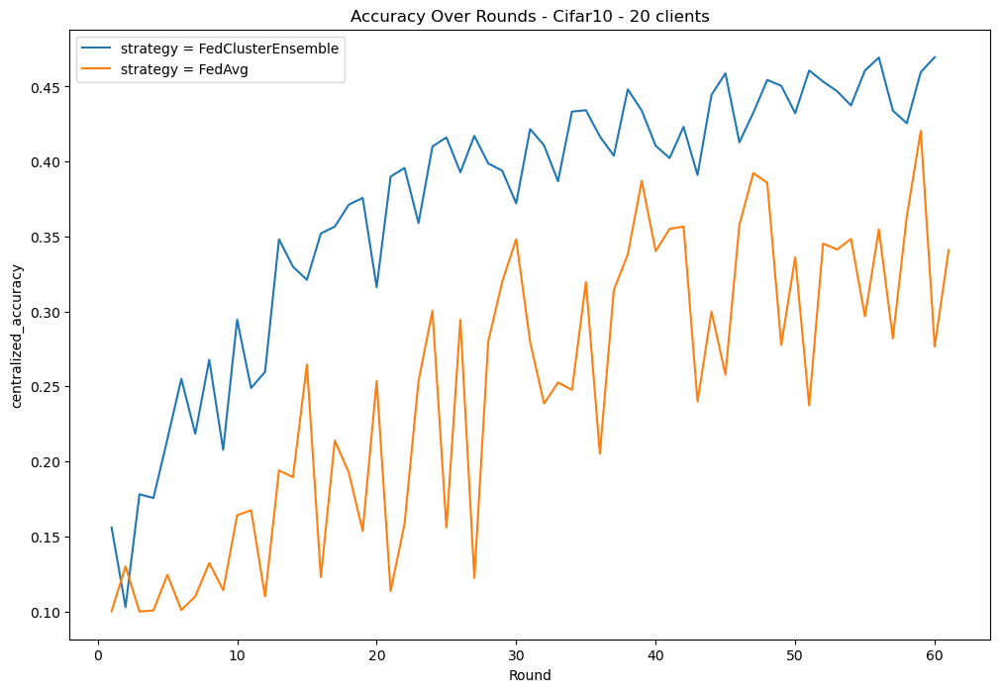

In [11]:

# Define filter criteria
filter_criteria = {
    'ID': [74,92]
}

# Apply the single filter and plot the results

filtered_experiments = filter_experiments(experiments, filter_criteria)

print(len(filtered_experiments))
plot_centralized_metrics(filtered_experiments, title="Accuracy Over Rounds - Cifar10 - 20 clients")
#plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'aggregated_test_accuracy')
#plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'distributed_test_loss')

In [5]:
from scipy import stats
import numpy as np

def plot_average_with_confidence_interval(experiments, title="Experiment Results", metric='centralized_accuracy', label_attr='strategy'):
    # Create a new figure with the specified size and DPI
    figsize = (12, 8)
    plt.figure(figsize=figsize, dpi=100)
    
    # Get the number of rounds based on the centralized metrics of the first experiment
    num_rounds = len(experiments[0].centralized_metrics[metric])
    
    # Collect the centralized accuracy for each round across all experiments
    metrics_per_round = np.zeros((len(experiments), num_rounds))
    for i, exp in enumerate(experiments):
        metrics_per_round[i, :] = exp.centralized_metrics[metric]
    
    # Calculate the mean and standard error across experiments for each round
    mean_metrics = np.mean(metrics_per_round, axis=0)
    stderr_metrics = stats.sem(metrics_per_round, axis=0)  # Standard error of the mean
    
    # Calculate the confidence interval (95% confidence level)
    ci = 1.96 * stderr_metrics  # 1.96 is the z-score for 95% confidence
    
    rounds = range(1, num_rounds + 1)
    
    # Plot the average metric
    plt.plot(rounds, mean_metrics, label='Average Accuracy', color='blue')
    
    # Plot the confidence interval as a shaded area
    plt.fill_between(rounds, mean_metrics - ci, mean_metrics + ci, color='blue', alpha=0.2, label='95% Confidence Interval')
    
    plt.title(title)
    plt.xlabel("Round")
    plt.ylabel(metric)
    plt.legend()
    plt.show()
    
def plot_average_with_confidence_interval2(experiments, experiments2, title="Experiment Results", metric='centralized_accuracy', label_attr='strategy'):
    # Create a new figure with the specified size and DPI
    figsize = (12, 8)  # Adjust the size for better visibility; MDPI may prefer figures not too large
    plt.figure(figsize=figsize, dpi=300)  # 300 DPI is generally sufficient for publication quality
    
    # Ensure both sets have the same number of rounds
    num_rounds1 = len(experiments[0].centralized_metrics[metric])
    num_rounds2 = len(experiments2[0].centralized_metrics[metric])
    
    # Collect the centralized accuracy for each round across all experiments (set 1)
    metrics_per_round1 = np.zeros((len(experiments), num_rounds1))
    for i, exp in enumerate(experiments):
        metrics_per_round1[i, :] = exp.centralized_metrics[metric]
    
    # Calculate the mean and standard error for experiments set 1
    mean_metrics1 = np.mean(metrics_per_round1, axis=0)
    stderr_metrics1 = stats.sem(metrics_per_round1, axis=0)  # Standard error of the mean
    
    # Calculate the confidence interval for experiments set 1 (95% confidence level)
    ci1 = 1.96 * stderr_metrics1
    
    # Collect the centralized accuracy for each round across all experiments (set 2)
    metrics_per_round2 = np.zeros((len(experiments2), num_rounds2))
    for i, exp in enumerate(experiments2):
        metrics_per_round2[i, :] = exp.centralized_metrics[metric]
    
    # Calculate the mean and standard error for experiments set 2
    mean_metrics2 = np.mean(metrics_per_round2, axis=0)
    stderr_metrics2 = stats.sem(metrics_per_round2, axis=0)  # Standard error of the mean
    
    # Calculate the confidence interval for experiments set 2 (95% confidence level)
    ci2 = 1.96 * stderr_metrics2
    
    rounds1 = range(1, num_rounds1 + 1)
    rounds2 = range(1, num_rounds2 + 1)
    
    # Plot the average metric for experiments set 1
    plt.plot(rounds1, mean_metrics1, label='FedClusterEnsemble - Cyclic', color='blue', linewidth=2)
    
    # Plot the confidence interval as a shaded area for set 1
    plt.fill_between(rounds1, mean_metrics1 - ci1, mean_metrics1 + ci1, color='blue', alpha=0.2)
    
    # Plot the average metric for experiments set 2
    plt.plot(rounds2, mean_metrics2, label='FedAvg - 70%', color='red', linewidth=2)
    
    # Plot the confidence interval as a shaded area for set 2
    plt.fill_between(rounds2, mean_metrics2 - ci2, mean_metrics2 + ci2, color='red', alpha=0.2)
    
    # Improve font sizes for better visibility
    plt.title(title, fontsize=18)
    plt.xlabel("Round", fontsize=16)
    plt.ylabel(metric.replace('_', ' ').capitalize(), fontsize=16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    
    # Adjust the legend for better visibility
    plt.legend(fontsize=14, loc='best', frameon=False)
    
    # Add grid lines for better visual clarity
    plt.grid(True, linestyle='--', alpha=0.5)

    # Save the figure with high resolution suitable for publication
    plt.tight_layout()  # Ensure everything fits within the figure area
    plt.savefig('comparison_figure.png', dpi=300, bbox_inches='tight')  # Save as a high-res image

    plt.show()
    
def calculate_cumulative_accuracy_gain(experiments, experiments2, metric='centralized_accuracy'):
    """
    Calculate the Cumulative Accuracy Gain between two sets of experiments, handling cases where the number of rounds is different.

    Parameters:
    - experiments: List of experiment objects for the first set (e.g., proposed approach).
    - experiments2: List of experiment objects for the second set (e.g., FedAvg).
    - metric: The metric to compare (default is 'centralized_accuracy').

    Returns:
    - cumulative_gain: A scalar value representing the cumulative gain of the proposed approach over FedAvg.
    - gain_per_round: A numpy array containing the difference in accuracy per round (up to the minimum number of rounds).
    """
    # Get the number of rounds for each set
    num_rounds1 = len(experiments[0].centralized_metrics[metric])
    num_rounds2 = len(experiments2[0].centralized_metrics[metric])
    
    # Take the minimum number of rounds to handle the mismatch
    num_rounds = min(num_rounds1, num_rounds2)
    
    # Collect the centralized accuracy for each round across all experiments (set 1)
    metrics_per_round1 = np.zeros((len(experiments), num_rounds))
    for i, exp in enumerate(experiments):
        metrics_per_round1[i, :] = exp.centralized_metrics[metric][:num_rounds]  # Trim to min rounds
    
    # Calculate the mean accuracy for experiments set 1
    mean_metrics1 = np.mean(metrics_per_round1, axis=0)
    
    # Collect the centralized accuracy for each round across all experiments (set 2)
    metrics_per_round2 = np.zeros((len(experiments2), num_rounds))
    for i, exp in enumerate(experiments2):
        metrics_per_round2[i, :] = exp.centralized_metrics[metric][:num_rounds]  # Trim to min rounds
    
    # Calculate the mean accuracy for experiments set 2
    mean_metrics2 = np.mean(metrics_per_round2, axis=0)
    
    # Calculate the accuracy difference (gain) per round
    gain_per_round = mean_metrics1 - mean_metrics2
    
    # Calculate the cumulative gain across all rounds
    cumulative_gain = np.sum(gain_per_round)
    
    return cumulative_gain, gain_per_round

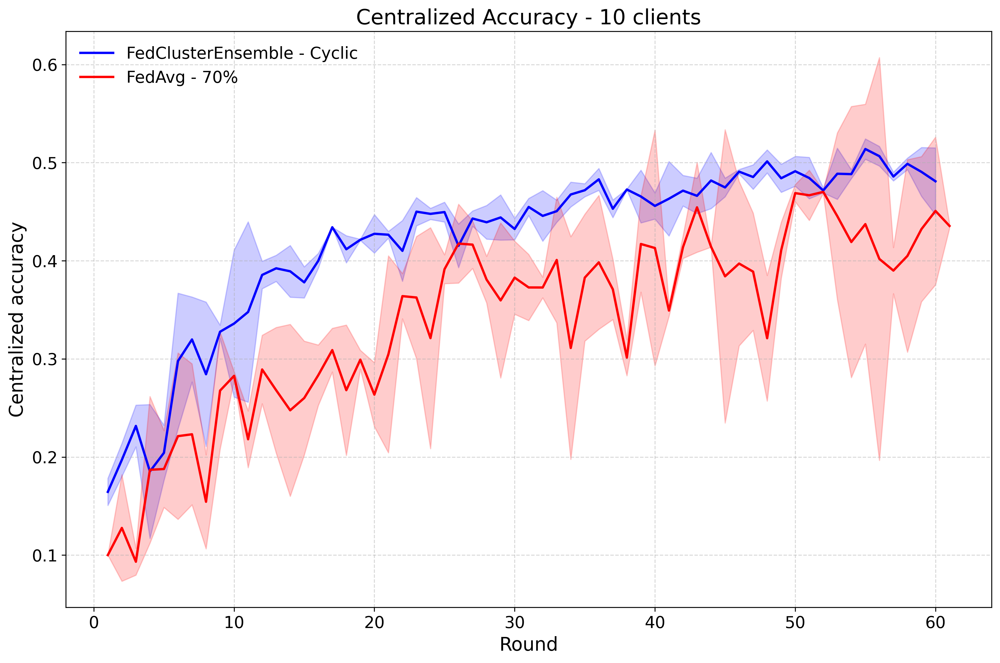

In [29]:
# Define filter criteria
filter_criteria = {
    'ID': [103,85]
}

# Apply the single filter and plot the results

fed_clustered_10 = filter_experiments(experiments, filter_criteria)


# Fed Avg 10 clients

# Define filter criteria
filter_criteria = {
    'ID': [90,104]
}

# Apply the single filter and plot the results

fed_avg_10_exp = filter_experiments(experiments, filter_criteria)


plot_average_with_confidence_interval2(fed_clustered_10, fed_avg_10_exp, title="Centralized Accuracy - 10 clients", metric='centralized_accuracy', label_attr='strategy')

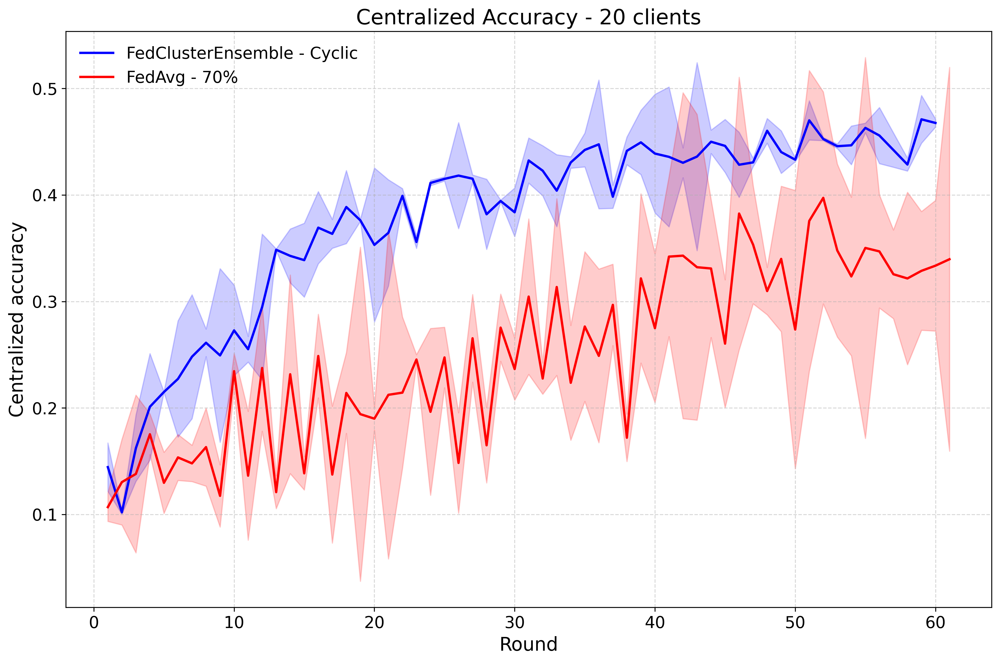

In [30]:
# Define filter criteria
filter_criteria = {
    'ID': [74,75]
}

# Apply the single filter and plot the results

fed_clustered_20 = filter_experiments(experiments, filter_criteria)


# Fed Avg 20 clients

# Define filter criteria
filter_criteria = {
    'ID': [58,106]
}

# Apply the single filter and plot the results

fed_avg_20_exp = filter_experiments(experiments, filter_criteria)


plot_average_with_confidence_interval2( fed_clustered_20,fed_avg_20_exp, title="Centralized Accuracy - 20 clients", metric='centralized_accuracy', label_attr='strategy')

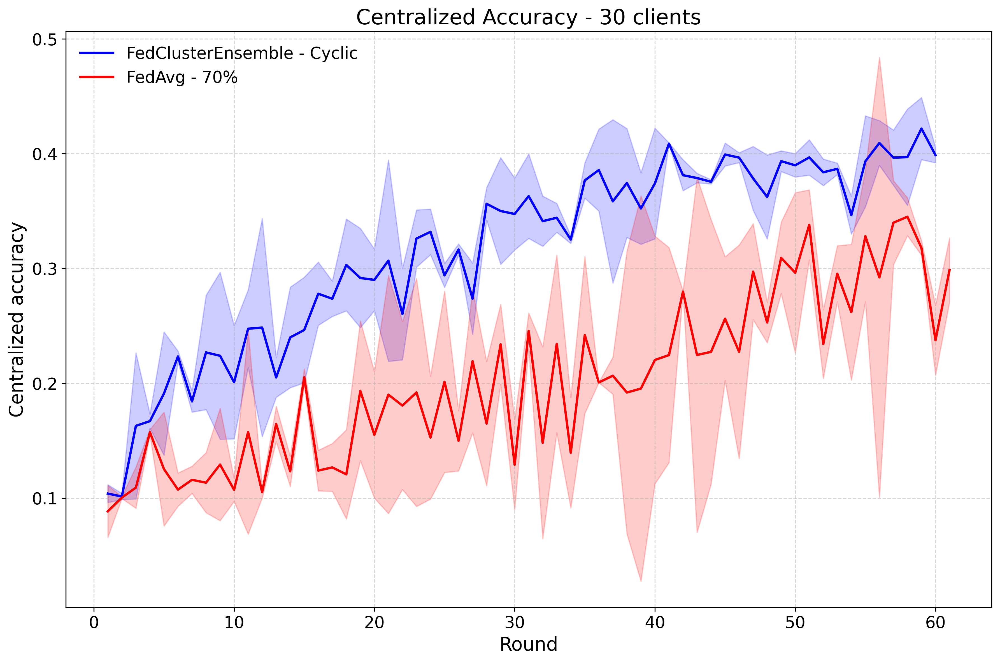

In [36]:
# Define filter criteria
# FedEnsemble 0.7 30 clients
filter_criteria = {
    'ID': [102,86]
}

# Apply the single filter and plot the results

fed_clustered_30 = filter_experiments(experiments, filter_criteria)


# Fed Avg 30 clients

# Define filter criteria
filter_criteria = {
    'ID': [89,107]
}

# Apply the single filter and plot the results

fed_avg_30_exp = filter_experiments(experiments, filter_criteria)


plot_average_with_confidence_interval2(fed_clustered_30,fed_avg_30_exp , title="Centralized Accuracy - 30 clients", metric='centralized_accuracy', label_attr='strategy')

In [40]:
# Assuming 'experiments' and 'experiments2' are your datasets
cumulative_gain, gain_per_round = calculate_cumulative_accuracy_gain(fed_clustered_30,fed_avg_30_exp)

print("Cumulative Accuracy Gain 30 clients:", cumulative_gain)

cumulative_gain, gain_per_round = calculate_cumulative_accuracy_gain(fed_clustered_20,fed_avg_20_exp)

print("Cumulative Accuracy Gain 20 :", cumulative_gain)

cumulative_gain, gain_per_round = calculate_cumulative_accuracy_gain(fed_clustered_10,fed_avg_10_exp)

print("Cumulative Accuracy Gain 10", cumulative_gain)
#print("Accuracy Gain per round:", gain_per_round)

Cumulative Accuracy Gain: 6.9091
Cumulative Accuracy Gain: 7.764899999999999
Cumulative Accuracy Gain: 4.920649999999998


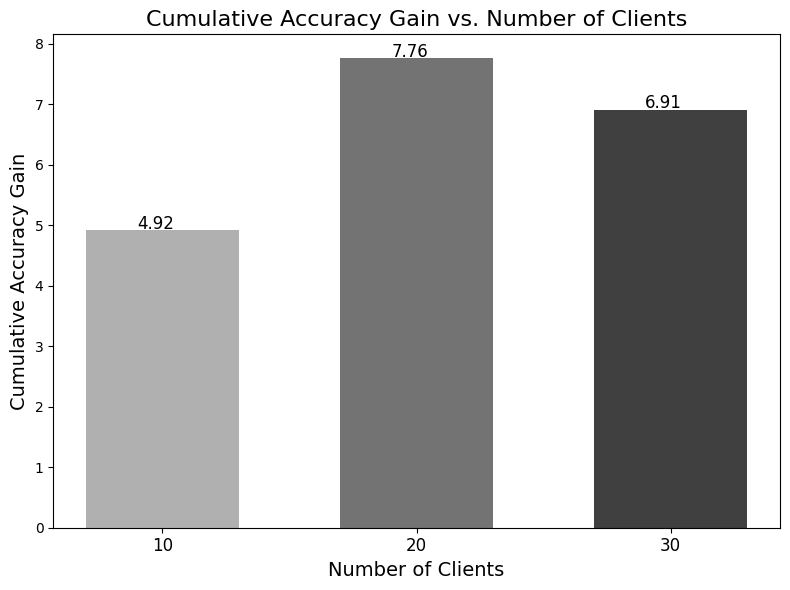

In [49]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming you have calculated the cumulative accuracy gain for different client setups
cumulative_gain_10, _ = calculate_cumulative_accuracy_gain(fed_clustered_10, fed_avg_10_exp)
cumulative_gain_20, _ = calculate_cumulative_accuracy_gain(fed_clustered_20, fed_avg_20_exp)
cumulative_gain_30, _ = calculate_cumulative_accuracy_gain(fed_clustered_30, fed_avg_30_exp)

# Store the cumulative gains and corresponding client numbers
clients = [10, 20, 30]
cumulative_gains = [cumulative_gain_10, cumulative_gain_20, cumulative_gain_30]

# Set the positions of the bars (closer together)
x_positions = np.array([1, 2, 3])  # Custom x-axis positions for the bars

# Plot the bar chart with grayscale colors
plt.figure(figsize=(8, 6))
plt.bar(x_positions, cumulative_gains, color=['#b0b0b0', '#737373', '#404040'], width=0.6)  # Grayscale shades

# Adding labels and title
plt.xlabel("Number of Clients", fontsize=14)
plt.ylabel("Cumulative Accuracy Gain", fontsize=14)
plt.title("Cumulative Accuracy Gain vs. Number of Clients", fontsize=16)

# Set x-axis ticks to custom positions and use "10", "20", and "30" as labels
plt.xticks(ticks=x_positions, labels=clients, fontsize=12)

# Display the values on top of the bars
for i, v in enumerate(cumulative_gains):
    plt.text(x_positions[i] - 0.1, v + 0.02, f"{v:.2f}", fontsize=12)  # Adjust text placement

# Show the plot
plt.tight_layout()
plt.show()





In [1]:
from niid_bench.main import main_wrapper

num_rounds = 30

fraction_fit_lst = [0.5] * num_rounds

tuple_result = main_wrapper(fraction_fit_lst)

print(tuple_result)

c:\Users\AFreitas\AppData\Local\pypoetry\Cache\virtualenvs\niid-bench-rTMtSNmn-py3.10\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2024-10-09 05:31:39,508	INFO util.py:159 -- Missing packages: ['ipywidgets']. Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


num_clients: 20
num_epochs: 2
batch_size: 64
clients_per_round: 14
learning_rate: 0.01
num_rounds: 3
partitioning: iid
dataset_name: cifar10
dataset_seed: 42
alpha: 0.5
labels_per_client: 2
momentum: 0.9
weight_decay: 1.0e-05
client_fn:
  _target_: niid_bench.client_fedavg.gen_client_fn
  _recursive_: false
  num_epochs: ${num_epochs}
  learning_rate: ${learning_rate}
  momentum: ${momentum}
  weight_decay: ${weight_decay}
dataset:
  name: ${dataset_name}
  partitioning: ${partitioning}
  batch_size: ${batch_size}
  val_split: 0.0
  seed: ${dataset_seed}
  alpha: ${alpha}
  labels_per_client: ${labels_per_client}
model:
  _target_: niid_bench.models.CNN
  input_dim: 400
  hidden_dims:
  - 120
  - 84
  num_classes: 10
fraction_fit_lst: null
strategy:
  _target_: niid_bench.strategy.FedAvgGenetic
  fraction_fit: 1.0e-05
  fraction_evaluate: 0
  min_fit_clients: ${clients_per_round}
  min_available_clients: ${clients_per_round}
  min_evaluate_clients: ${clients_per_round}
client: null
ser

INFO flwr 2024-10-09 05:32:41,881 | app.py:175 | Starting Flower simulation, config: ServerConfig(num_rounds=3, round_timeout=None)
INFO:flwr:Starting Flower simulation, config: ServerConfig(num_rounds=3, round_timeout=None)
2024-10-09 05:33:37,609	INFO worker.py:1621 -- Started a local Ray instance.
INFO flwr 2024-10-09 05:34:16,781 | app.py:210 | Flower VCE: Ray initialized with resources: {'object_store_memory': 380883763.0, 'memory': 761767527.0, 'node:127.0.0.1': 1.0, 'CPU': 8.0, 'node:__internal_head__': 1.0}
INFO:flwr:Flower VCE: Ray initialized with resources: {'object_store_memory': 380883763.0, 'memory': 761767527.0, 'node:127.0.0.1': 1.0, 'CPU': 8.0, 'node:__internal_head__': 1.0}
INFO flwr 2024-10-09 05:34:16,783 | app.py:224 | Flower VCE: Resources for each Virtual Client: {'num_cpus': 4, 'num_gpus': 0.0}
INFO:flwr:Flower VCE: Resources for each Virtual Client: {'num_cpus': 4, 'num_gpus': 0.0}
INFO flwr 2024-10-09 05:34:16,903 | app.py:270 | Flower VCE: Creating VirtualCli

(0.1218, 1.5)


In [4]:
!pip install "pandas<2.0.0"


   ---------------------------------------- 0.0/10.4 MB ? eta -:--:--
   ---------------------------------------- 0.0/10.4 MB 1.3 MB/s eta 0:00:09
   ---------------------------------------- 0.0/10.4 MB 393.8 kB/s eta 0:00:27
   ---------------------------------------- 0.1/10.4 MB 653.6 kB/s eta 0:00:16
   ---------------------------------------- 0.1/10.4 MB 717.5 kB/s eta 0:00:15
   ---------------------------------------- 0.1/10.4 MB 717.5 kB/s eta 0:00:15
   ---------------------------------------- 0.1/10.4 MB 717.5 kB/s eta 0:00:15
   - -------------------------------------- 0.3/10.4 MB 1.0 MB/s eta 0:00:10
   - -------------------------------------- 0.4/10.4 MB 1.1 MB/s eta 0:00:10
   - -------------------------------------- 0.4/10.4 MB 1.1 MB/s eta 0:00:10
   - -------------------------------------- 0.5/10.4 MB 1.0 MB/s eta 0:00:10
   - -------------------------------------- 0.5/10.4 MB 1.0 MB/s eta 0:00:10
   -- ------------------------------------- 0.6/10.4 MB 1.1 MB/s eta 0:00


[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


10


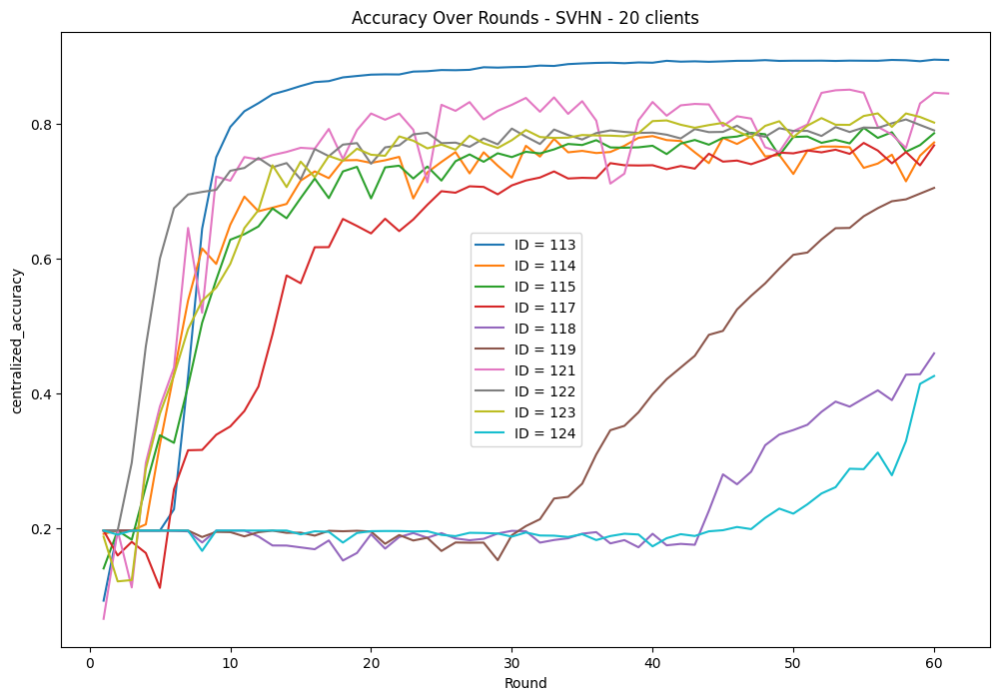

: 

In [45]:

# Define filter criteria
filter_criteria = {
    'ID': [121,122,123,124,119,118,114,117,113,115]
}

# Apply the single filter and plot the results

filtered_experiments = filter_experiments(experiments, filter_criteria)

print(len(filtered_experiments))
plot_centralized_metrics(filtered_experiments, title="Accuracy Over Rounds - SVHN - 20 clients", label_attr='ID')
#plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'aggregated_test_accuracy')
#plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'distributed_test_loss')

#plot_fourier_metric(filtered_experiments, metric='centralized_accuracy', title="Fourier Transform of Accuracy", label_attr='ID')

2


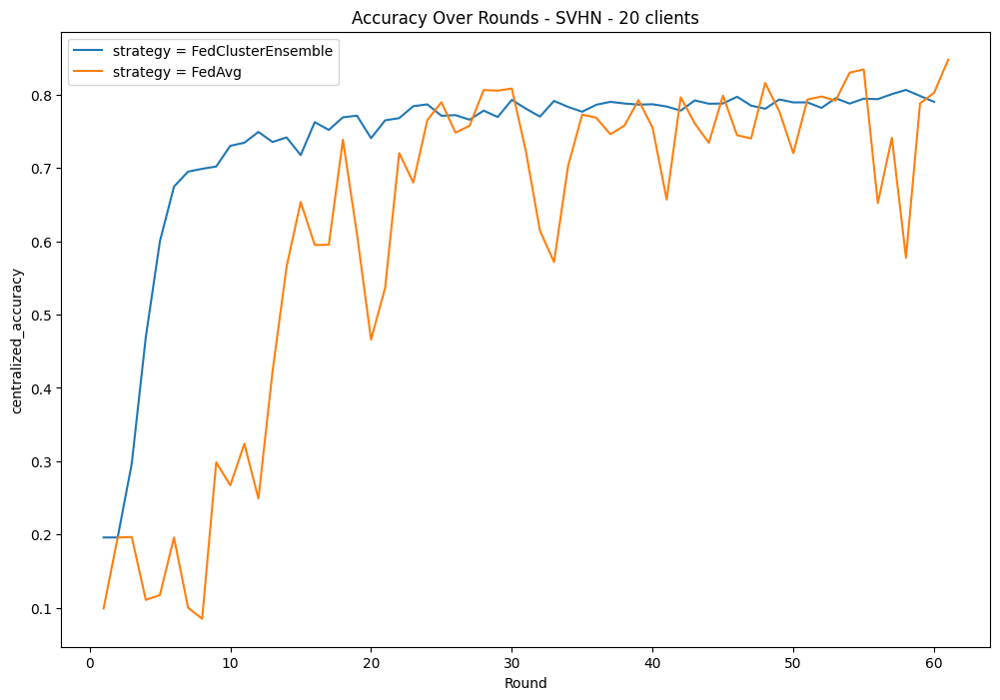

In [5]:
# Define filter criteria
filter_criteria = {
    'ID': [125,122]
}

# Apply the single filter and plot the results

filtered_experiments = filter_experiments(experiments, filter_criteria)

print(len(filtered_experiments))
plot_centralized_metrics(filtered_experiments, title="Accuracy Over Rounds - SVHN - 20 clients", label_attr='strategy')
#plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'aggregated_test_accuracy')
#plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'distributed_test_loss')

#plot_fourier_metric(filtered_experiments, metric='centralized_accuracy', title="Fourier Transform of Accuracy", label_attr='ID')

3


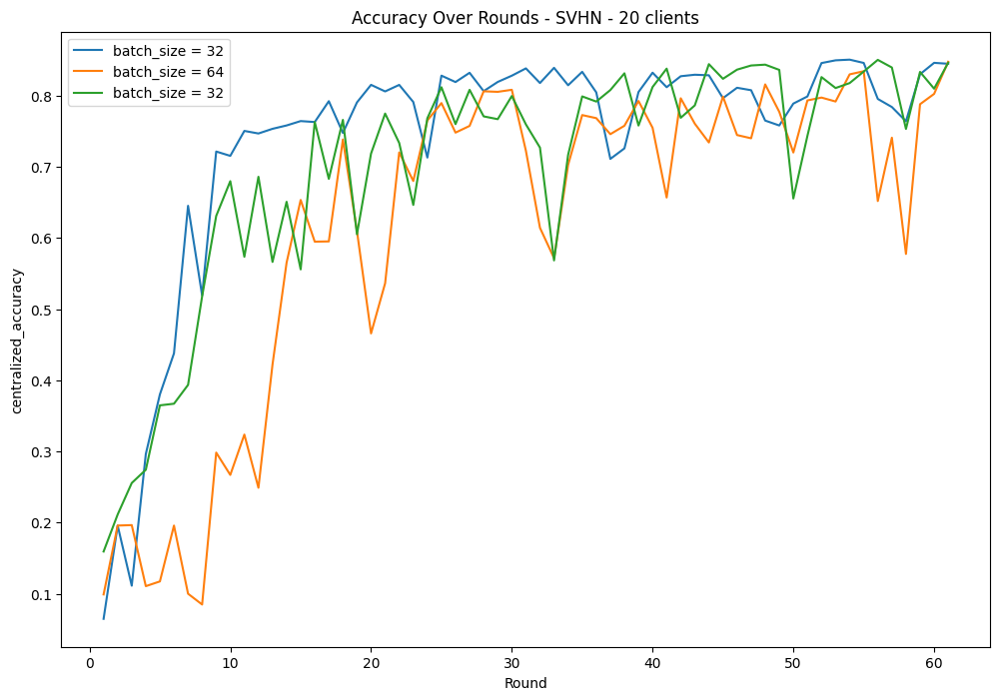

In [20]:
# Define filter criteria
filter_criteria = {
    'ID': [125,121,126]
}

# Apply the single filter and plot the results

filtered_experiments = filter_experiments(experiments, filter_criteria)

print(len(filtered_experiments))
plot_centralized_metrics(filtered_experiments, title="Accuracy Over Rounds - SVHN - 20 clients", label_attr='batch_size')
#plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'aggregated_test_accuracy')
#plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'distributed_test_loss')

#plot_fourier_metric(filtered_experiments, metric='centralized_accuracy', title="Fourier Transform of Accuracy", label_attr='ID')

11


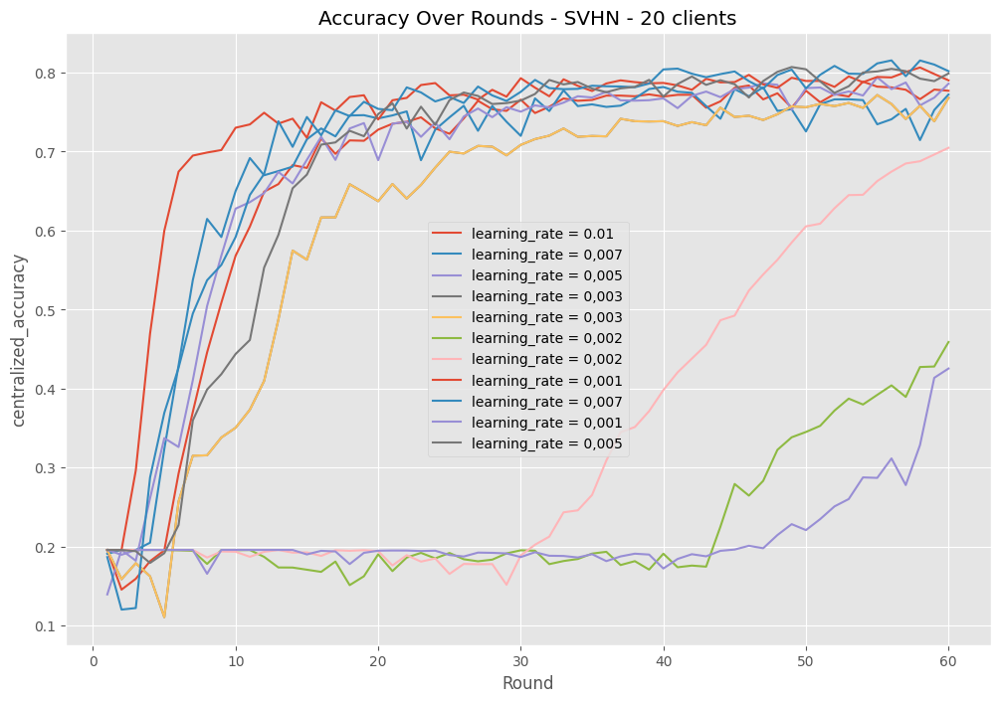

In [36]:
# Define filter criteria
filter_criteria = {
    'ID': [114,115,116, 117, 118, 119, 122, 123, 124,128, 111]
}

# Apply the single filter and plot the results

filtered_experiments = filter_experiments(experiments, filter_criteria)

print(len(filtered_experiments))
plot_centralized_metrics(filtered_experiments, title="Accuracy Over Rounds - SVHN - 20 clients", label_attr='learning_rate')
#plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'aggregated_test_accuracy')
#plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'distributed_test_loss')

#plot_fourier_metric(filtered_experiments, metric='centralized_accuracy', title="Fourier Transform of Accuracy", label_attr='ID')

In [26]:
from niid_bench.utils import parse_log_file, save_metrics_to_csv
df = parse_log_file(filtered_experiments[0].output_folder + '\\main.log')
save_metrics_to_csv(df, filtered_experiments[0].output_folder)

Metrics saved to c:\Users\AFreitas\Documents\git_projects\flower\baselines\niid_bench\outputs\2024-10-24\cluster_losses.csv


In [31]:
for exp in filtered_experiments:
    df = parse_log_file(exp.output_folder + '\\main.log')
    save_metrics_to_csv(df, exp.output_folder + '\\main.log')

Metrics saved to c:\Users\AFreitas\Documents\git_projects\flower\baselines\niid_bench\outputs\2024-10-22\02-49-35\cluster_losses.csv
Metrics saved to c:\Users\AFreitas\Documents\git_projects\flower\baselines\niid_bench\outputs\2024-10-22\19-36-41\cluster_losses.csv
Metrics saved to c:\Users\AFreitas\Documents\git_projects\flower\baselines\niid_bench\outputs\2024-10-22\21-56-50\cluster_losses.csv
Output file 'c:\Users\AFreitas\Documents\git_projects\flower\baselines\niid_bench\outputs\2024-10-22\21-56-50\cluster_losses.csv' already exists. Skipping save.
Metrics saved to c:\Users\AFreitas\Documents\git_projects\flower\baselines\niid_bench\outputs\2024-10-23\12-21-03\cluster_losses.csv
Metrics saved to c:\Users\AFreitas\Documents\git_projects\flower\baselines\niid_bench\outputs\2024-10-23\16-47-20\cluster_losses.csv
Metrics saved to c:\Users\AFreitas\Documents\git_projects\flower\baselines\niid_bench\outputs\2024-10-24\04-53-17\cluster_losses.csv
Metrics saved to c:\Users\AFreitas\Docume

In [25]:
df.head()

,round,cluster_0,cluster_1,cluster_2
0,1,1.109076,1.032309,1.397200
1,2,1.104687,1.029041,1.386096
2,3,1.097096,0.715592,1.305334
3,4,1.066630,0.229905,0.596838
4,5,0.519148,0.173198,0.357985


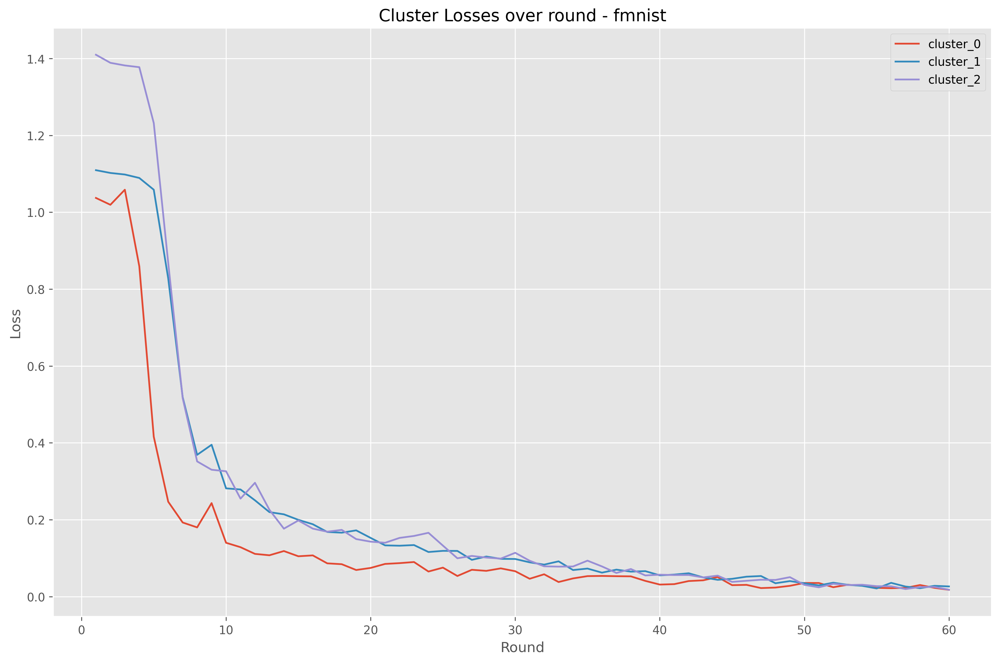

In [34]:
plot_cluster_losses(filtered_experiments[0].output_folder, title = 'Cluster Losses over round - fmnist')

3


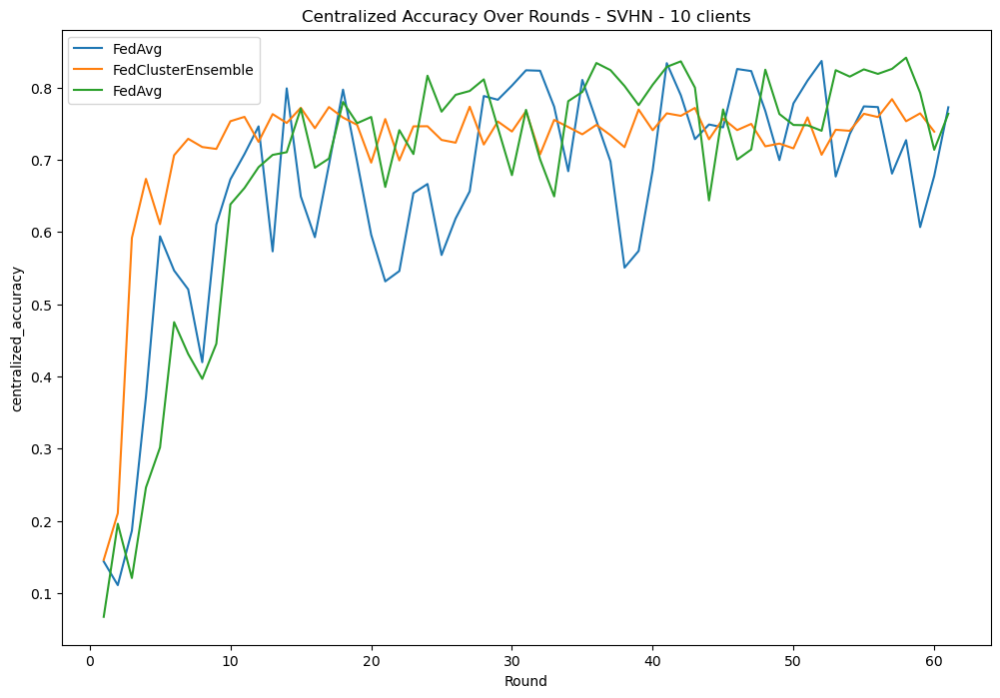

In [7]:
# Define filter criteria
filter_criteria = {
    'ID': [135,148,144]
}

# Apply the single filter and plot the results

filtered_experiments = filter_experiments(experiments, filter_criteria)

print(len(filtered_experiments))
plot_centralized_metrics(filtered_experiments, title="Centralized Accuracy Over Rounds - SVHN - 10 clients", label_attr='strategy')
#plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'aggregated_test_accuracy')
#plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'distributed_test_loss')

#plot_fourier_metric(filtered_experiments, metric='centralized_accuracy', title="Fourier Transform of Accuracy", label_attr='ID')

3


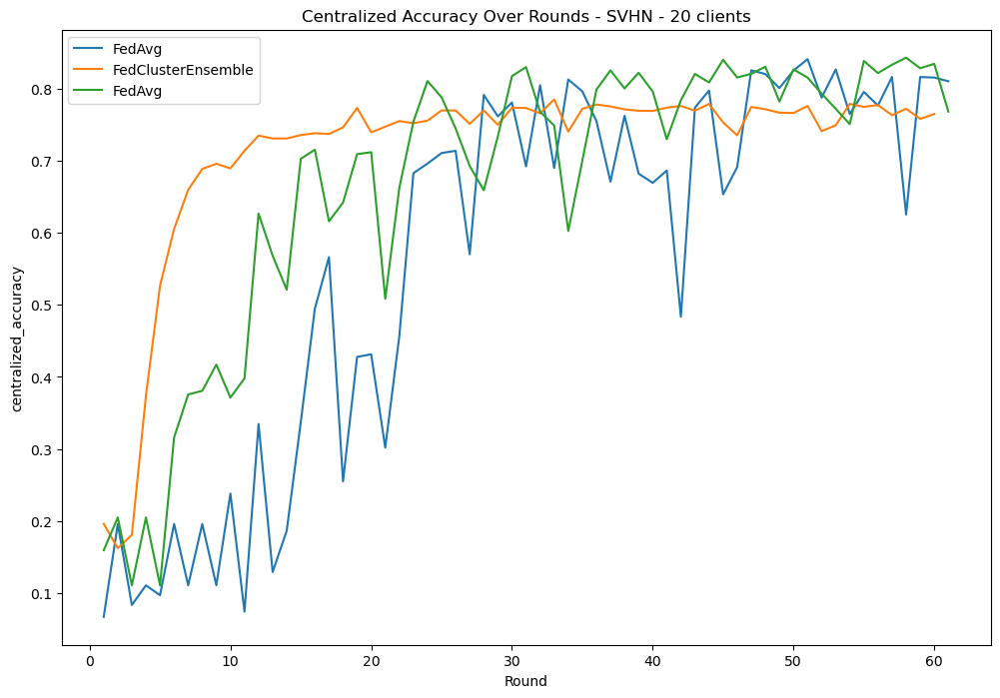

In [5]:
# Define filter criteria
filter_criteria = {
    'ID': [142,136,147]
}

# Apply the single filter and plot the results

filtered_experiments = filter_experiments(experiments, filter_criteria)

print(len(filtered_experiments))
plot_centralized_metrics(filtered_experiments, title="Centralized Accuracy Over Rounds - SVHN - 20 clients", label_attr='strategy')
#plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'aggregated_test_accuracy')
#plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'distributed_test_loss')

#plot_fourier_metric(filtered_experiments, metric='centralized_accuracy', title="Fourier Transform of Accuracy", label_attr='ID')

3


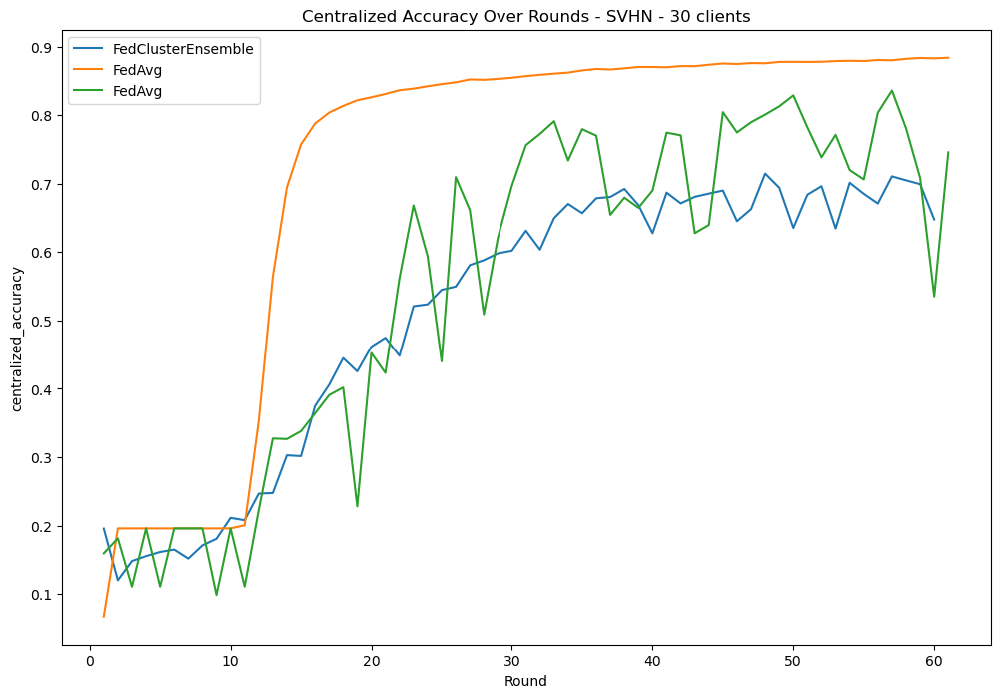

In [13]:
# Define filter criteria
filter_criteria = {
    'ID': [130,145,138]
}

# Apply the single filter and plot the results

filtered_experiments = filter_experiments(experiments, filter_criteria)

print(len(filtered_experiments))
plot_centralized_metrics(filtered_experiments, title="Centralized Accuracy Over Rounds - SVHN - 30 clients", label_attr='strategy')
#plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'aggregated_test_accuracy')
#plot_distributed_metrics(filtered_experiments, title="Experiment Results", metric = 'distributed_test_loss')

#plot_fourier_metric(filtered_experiments, metric='centralized_accuracy', title="Fourier Transform of Accuracy", label_attr='ID')

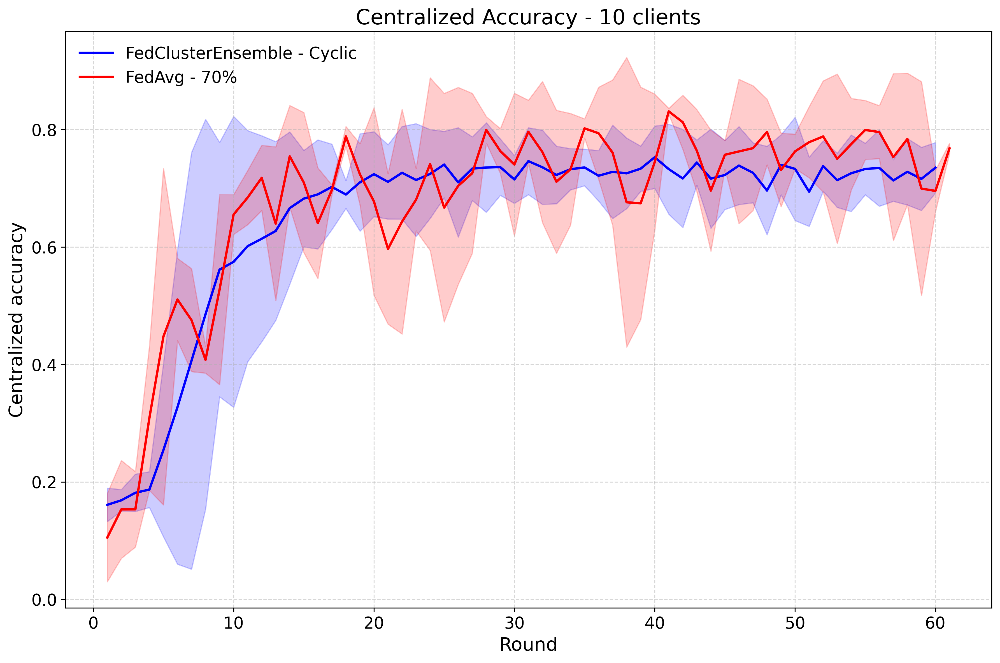

In [8]:
# Define filter criteria
filter_criteria = {
    'ID': [129,132]
}

# Apply the single filter and plot the results

fed_clustered_10 = filter_experiments(experiments, filter_criteria) #svhn

# Fed Avg 10 clients

# Define filter criteria
filter_criteria = {
    'ID': [148,135]
}

# Apply the single filter and plot the results

fed_avg_10_exp = filter_experiments(experiments, filter_criteria)


plot_average_with_confidence_interval2( fed_clustered_10,fed_avg_10_exp, title="Centralized Accuracy - 10 clients", metric='centralized_accuracy', label_attr='strategy')

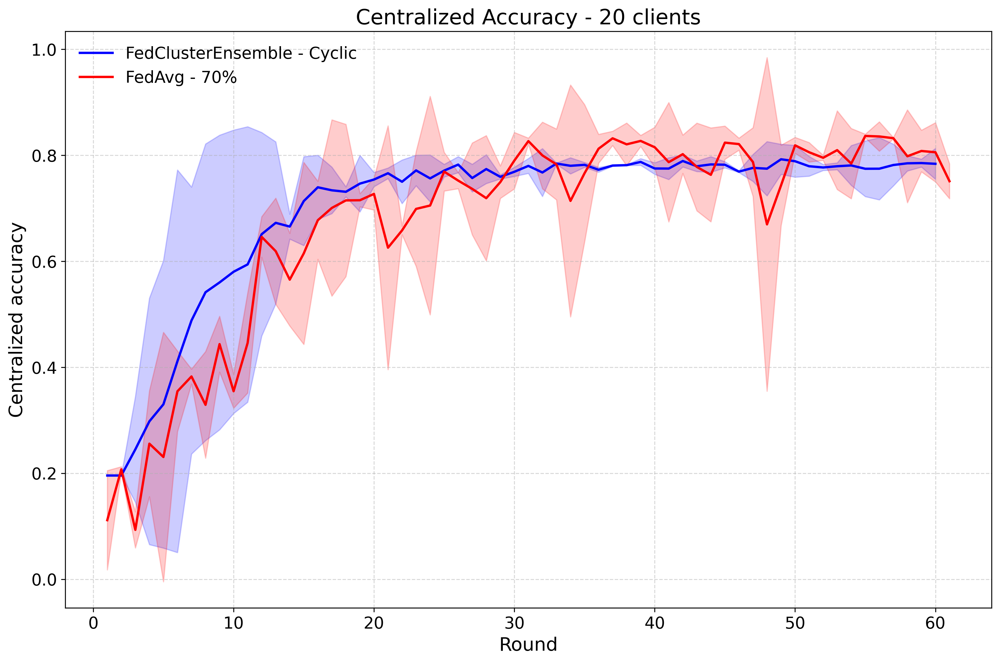

In [6]:
# Define filter criteria
filter_criteria = {
    'ID': [128,167]
}

# Apply the single filter and plot the results

fed_clustered_20 = filter_experiments(experiments, filter_criteria) #svhn

# Fed Avg 20 clients

# Define filter criteria
filter_criteria = {
    'ID': [140,147]
}

# Apply the single filter and plot the results

fed_avg_20_exp = filter_experiments(experiments, filter_criteria)


plot_average_with_confidence_interval2( fed_clustered_20,fed_avg_20_exp, title="Centralized Accuracy - 20 clients", metric='centralized_accuracy', label_attr='strategy')

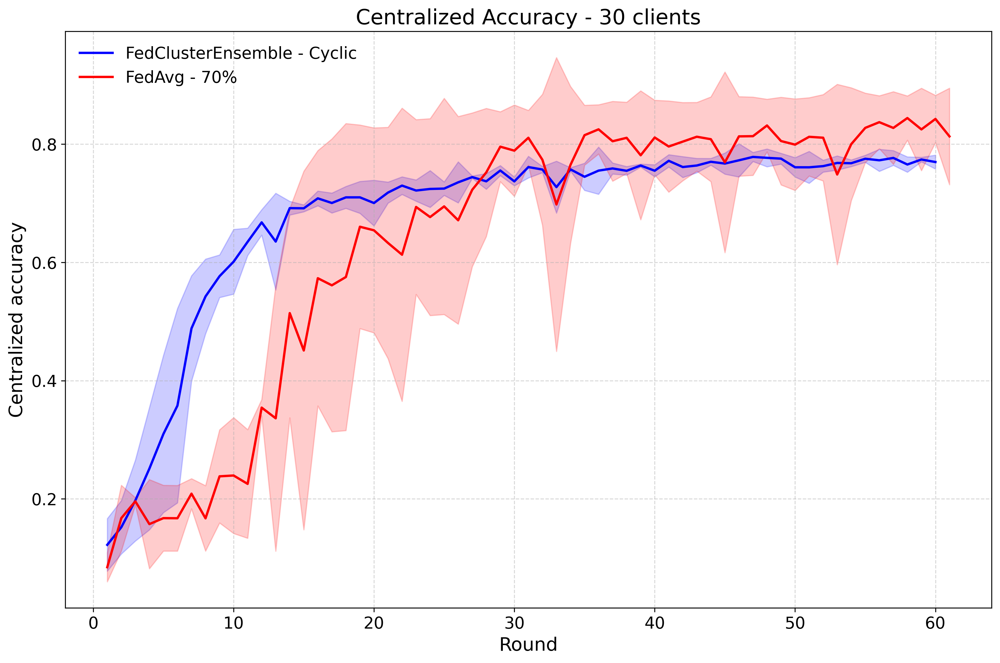

In [7]:
# Define filter criteria
filter_criteria = {
    'ID': [163,164, 165]
}

# Apply the single filter and plot the results

fed_clustered_30 = filter_experiments(experiments, filter_criteria) #svhn

# Fed Avg 30 clients

# Define filter criteria
filter_criteria = {
    'ID': [146,138,168]
}

# Apply the single filter and plot the results

fed_avg_30_exp = filter_experiments(experiments, filter_criteria)


plot_average_with_confidence_interval2( fed_clustered_30,fed_avg_30_exp, title="Centralized Accuracy - 30 clients", metric='centralized_accuracy', label_attr='strategy')